In [1]:
!pwd
import sys
%reload_ext autoreload
%autoreload 2
%matplotlib inline
sys.executable

/c/Users/81908/jupyter_notebook/tf_2_work/Probspace_geme_compe/notebook


'C:\\Users\\81908\\Anaconda3\\envs\\tfgpu\\python.exe'

# 対戦ゲームデータ分析甲子園
- https://prob.space/competitions/game_winner/data/62

In [2]:
import os
import gc
import sys
import joblib
import warnings
import itertools

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import optuna
from joblib import Parallel, delayed
from sklearn import preprocessing
from sklearn.feature_selection import RFECV
from sklearn.inspection import permutation_importance
from sklearn.model_selection import *
from sklearn.metrics import *
import lightgbm as lgb
from lightgbm import *

sys.path.append(r"C:\Users\81908\Git\xfeat")
import xfeat
from xfeat import *
from xfeat.selector import *
from xfeat.utils import compress_df

sns.set()
warnings.simplefilter(action="ignore", category=FutureWarning)
pd.set_option('display.max_columns', None)

In [3]:
OUT_DATA = r"C:\Users\81908\jupyter_notebook\tf_2_work\Probspace_geme_compe\data\work"
os.makedirs(OUT_DATA, exist_ok=True)

OUT_MODEL = r"C:\Users\81908\jupyter_notebook\tf_2_work\Probspace_geme_compe\model\first"
os.makedirs(OUT_MODEL, exist_ok=True)

ORIG = r"C:\Users\81908\jupyter_notebook\tf_2_work\Probspace_geme_compe\data\orig"
train_df = pd.read_csv(f"{ORIG}/train_data.csv")
test_df = pd.read_csv(f"{ORIG}/test_data.csv")
df_all = train_df.append(test_df).reset_index(drop=True)

# データ確認

In [4]:
def df_info(df):
    df.info()
    display(df.head().style.background_gradient(cmap="Pastel1"))
    display(df.describe().T.style.background_gradient(cmap="Pastel1"))

    # カラム名 / カラムごとのユニーク値数 / 最も出現頻度の高い値 / 最も出現頻度の高い値の出現回数 / 欠損損値の割合 / 最も多いカテゴリの割合 / dtypes を表示
    stats = []
    for col in df.columns:
        stats.append(
            (
                col,
                df[col].nunique(),
                df[col].value_counts().index[0],
                df[col].value_counts().values[0],
                df[col].isnull().sum() * 100 / df.shape[0],
                df[col].value_counts(normalize=True, dropna=False).values[0] * 100,
                df[col].dtype,
            )
        )
    stats_df = pd.DataFrame(
        stats,
        columns=[
            "Feature",
            "Unique values",
            "Most frequent item",
            "Freuquence of most frequent item",
            "Percentage of missing values",
            "Percentage of values in the biggest category",
            "Type",
        ],
    )
    display(stats_df.sort_values("Percentage of missing values", ascending=False).style.background_gradient(cmap="Pastel1"))

In [5]:
df_info(train_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66125 entries, 0 to 66124
Data columns (total 32 columns):
id            66125 non-null int64
period        66125 non-null object
game-ver      66125 non-null object
lobby-mode    66125 non-null object
lobby         66125 non-null object
mode          66125 non-null object
stage         66125 non-null object
A1-weapon     66125 non-null object
A1-rank       51681 non-null object
A1-level      66125 non-null int64
A2-weapon     66125 non-null object
A2-rank       51681 non-null object
A2-level      66125 non-null float64
A3-weapon     66125 non-null object
A3-rank       51681 non-null object
A3-level      66125 non-null float64
A4-weapon     66074 non-null object
A4-rank       51638 non-null object
A4-level      66074 non-null float64
B1-weapon     66125 non-null object
B1-rank       51681 non-null object
B1-level      66125 non-null int64
B2-weapon     66125 non-null object
B2-rank       51681 non-null object
B2-level      66125 non-nul

,id,period,game-ver,lobby-mode,lobby,mode,stage,A1-weapon,A1-rank,A1-level,A2-weapon,A2-rank,A2-level,A3-weapon,A3-rank,A3-level,A4-weapon,A4-rank,A4-level,B1-weapon,B1-rank,B1-level,B2-weapon,B2-rank,B2-level,B3-weapon,B3-rank,B3-level,B4-weapon,B4-rank,B4-level,y
0,1,2019-10-15T20:00:00+00:00,5.0.1,regular,standard,nawabari,sumeshi,sshooter_becchu,nan,139,soytuber_custom,nan,118,pablo_hue,nan,13,hokusai,nan,10,bold_7,nan,28,hokusai_becchu,nan,26,herocharger_replica,nan,68,sharp_neo,nan,31,1
1,2,2019-12-14T04:00:00+00:00,5.0.1,regular,standard,nawabari,arowana,parashelter_sorella,nan,198,jetsweeper,nan,77,campingshelter_camo,nan,198,nzap85,nan,123,momiji,nan,83,squiclean_b,nan,118,campingshelter,nan,168,sputtery_clear,nan,151,0
2,3,2019-12-25T14:00:00+00:00,5.0.1,gachi,standard,hoko,ama,nzap89,a-,114,quadhopper_black,a,68,prime_becchu,a,225,jetsweeper,a,107,bold_7,a-,50,nzap85,a+,163,prime_becchu,a-,160,dualsweeper_custom,a,126,0
3,4,2019-11-11T14:00:00+00:00,5.0.1,regular,standard,nawabari,engawa,bamboo14mk1,nan,336,splatroller_becchu,nan,131,dynamo_tesla,nan,189,prime_becchu,nan,41,splatcharger_becchu,nan,273,liter4k,nan,189,promodeler_mg,nan,194,hotblaster_custom,nan,391,0
4,5,2019-12-14T06:00:00+00:00,5.0.1,gachi,standard,hoko,chozame,bold_7,x,299,hissen_hue,x,97,h3reelgun_d,x,96,splatroller,x,136,furo,x,101,sputtery_hue,x,45,bucketslosher_soda,x,246,wakaba,x,160,1


,count,mean,std,min,25%,50%,75%,max
id,66125,33063,19088.8,1,16532,33063,49594,66125
A1-level,66125,208.839,118.987,1,120,188,277,585
A2-level,66125,155.352,96.184,1,82,139,208,913
A3-level,66125,153.175,95.4707,1,80,137,205,920
A4-level,66074,156.002,95.5246,1,84,140,208,931
B1-level,66125,156.379,97.1095,1,83,139,210,920
B2-level,66125,152.765,95.3735,1,80,136,205,913
B3-level,66124,153.105,94.8917,1,81,137,205,933
B4-level,66058,157.87,95.7776,1,86,142,212,936
y,66125,0.524703,0.499393,0,0,1,1,1


,Feature,Unique values,Most frequent item,Freuquence of most frequent item,Percentage of missing values,Percentage of values in the biggest category,Type
29,B4-rank,12,x,24704,21.9297,37.3595,object
17,A4-rank,12,x,24714,21.9085,37.3747,object
23,B2-rank,12,x,24736,21.8435,37.4079,object
20,B1-rank,12,x,24736,21.8435,37.4079,object
26,B3-rank,12,x,24736,21.8435,37.4079,object
14,A3-rank,12,x,24736,21.8435,37.4079,object
8,A1-rank,12,x,24736,21.8435,37.4079,object
11,A2-rank,12,x,24736,21.8435,37.4079,object
30,B4-level,612,198,893,0.101323,1.35047,float64
28,B4-weapon,139,splatroller,3380,0.101323,5.11153,object


In [6]:
df_info(test_df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28340 entries, 0 to 28339
Data columns (total 31 columns):
id            28340 non-null int64
period        28340 non-null object
game-ver      28340 non-null object
lobby-mode    28340 non-null object
lobby         28340 non-null object
mode          28340 non-null object
stage         28340 non-null object
A1-weapon     28340 non-null object
A1-rank       22068 non-null object
A1-level      28340 non-null int64
A2-weapon     28340 non-null object
A2-rank       22068 non-null object
A2-level      28340 non-null float64
A3-weapon     28340 non-null object
A3-rank       22068 non-null object
A3-level      28340 non-null float64
A4-weapon     28325 non-null object
A4-rank       22060 non-null object
A4-level      28325 non-null float64
B1-weapon     28340 non-null object
B1-rank       22068 non-null object
B1-level      28340 non-null int64
B2-weapon     28340 non-null object
B2-rank       22068 non-null object
B2-level      28340 non-nul

,id,period,game-ver,lobby-mode,lobby,mode,stage,A1-weapon,A1-rank,A1-level,A2-weapon,A2-rank,A2-level,A3-weapon,A3-rank,A3-level,A4-weapon,A4-rank,A4-level,B1-weapon,B1-rank,B1-level,B2-weapon,B2-rank,B2-level,B3-weapon,B3-rank,B3-level,B4-weapon,B4-rank,B4-level
0,1,2019-12-17T12:00:00+00:00,5.0.1,gachi,standard,area,hakofugu,prime_collabo,x,174,herospinner_replica,x,130,nzap89,x,127,nova_becchu,x,233,furo,x,160,nautilus47,x,151,l3reelgun_d,x,213,nzap89,x,306
1,2,2019-11-25T16:00:00+00:00,5.0.1,gachi,standard,asari,anchovy,prime_becchu,s+,363,nzap89,s+,59,dynamo_becchu,s+,36,rapid_becchu,s+,225,furo,s+,326,dualsweeper_custom,s+,289,prime_becchu,s+,147,splatroller,s+,156
2,3,2019-10-22T08:00:00+00:00,5.0.1,gachi,standard,area,mutsugoro,furo_deco,s,116,bold,s,125,nzap85,s,124,wakaba,s,181,splatroller,s,76,momiji,s,232,nzap83,s,183,promodeler_pg,s,105
3,4,2019-12-30T04:00:00+00:00,5.0.1,gachi,standard,asari,devon,prime_becchu,s+,192,splatspinner_collabo,s+,115,pablo,s+,171,dualsweeper_custom,s+,170,momiji,s+,90,quadhopper_black,s+,119,soytuber,s+,172,prime,s+,70
4,5,2019-10-15T16:00:00+00:00,5.0.1,gachi,standard,yagura,anchovy,l3reelgun_d,x,267,rapid_becchu,x,223,heroroller_replica,x,240,hydra_custom,x,190,nzap83,x,259,sshooter_becchu,x,198,splatscope,x,50,screwslosher_becchu,x,287


,count,mean,std,min,25%,50%,75%,max
id,28340,14170.5,8181.2,1,7085.75,14170.5,21255.2,28340
A1-level,28340,208.422,118.525,1,120,188,277,584
A2-level,28340,154.657,95.8917,1,81,138,207,838
A3-level,28340,152.615,95.3408,1,80,136,205,718
A4-level,28325,155.381,95.3221,1,84,139,207,933
B1-level,28340,157.108,97.7774,2,83,139,211,920
B2-level,28340,152.772,95.4024,1,79,136,206,931
B3-level,28339,153.151,94.8699,1,81,136,205,931
B4-level,28310,155.591,94.4819,1,85,140,208,930


,Feature,Unique values,Most frequent item,Freuquence of most frequent item,Percentage of missing values,Percentage of values in the biggest category,Type
29,B4-rank,12,x,10574,22.2195,37.3112,object
17,A4-rank,12,x,10577,22.1595,37.3218,object
26,B3-rank,12,x,10583,22.1348,37.343,object
8,A1-rank,12,x,10583,22.1313,37.343,object
14,A3-rank,12,x,10583,22.1313,37.343,object
20,B1-rank,12,x,10583,22.1313,37.343,object
11,A2-rank,12,x,10583,22.1313,37.343,object
23,B2-rank,12,x,10583,22.1313,37.343,object
28,B4-weapon,139,splatroller,1422,0.105857,5.01764,object
30,B4-level,569,198,378,0.105857,1.3338,float64


In [7]:
df_info(df_all)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 94465 entries, 0 to 94464
Data columns (total 32 columns):
A1-level      94465 non-null int64
A1-rank       73749 non-null object
A1-weapon     94465 non-null object
A2-level      94465 non-null float64
A2-rank       73749 non-null object
A2-weapon     94465 non-null object
A3-level      94465 non-null float64
A3-rank       73749 non-null object
A3-weapon     94465 non-null object
A4-level      94399 non-null float64
A4-rank       73698 non-null object
A4-weapon     94399 non-null object
B1-level      94465 non-null int64
B1-rank       73749 non-null object
B1-weapon     94465 non-null object
B2-level      94465 non-null float64
B2-rank       73749 non-null object
B2-weapon     94465 non-null object
B3-level      94463 non-null float64
B3-rank       73748 non-null object
B3-weapon     94463 non-null object
B4-level      94368 non-null float64
B4-rank       73667 non-null object
B4-weapon     94368 non-null object
game-ver      94465 non

,A1-level,A1-rank,A1-weapon,A2-level,A2-rank,A2-weapon,A3-level,A3-rank,A3-weapon,A4-level,A4-rank,A4-weapon,B1-level,B1-rank,B1-weapon,B2-level,B2-rank,B2-weapon,B3-level,B3-rank,B3-weapon,B4-level,B4-rank,B4-weapon,game-ver,id,lobby,lobby-mode,mode,period,stage,y
0,139,nan,sshooter_becchu,118,nan,soytuber_custom,13,nan,pablo_hue,10,nan,hokusai,28,nan,bold_7,26,nan,hokusai_becchu,68,nan,herocharger_replica,31,nan,sharp_neo,5.0.1,1,standard,regular,nawabari,2019-10-15T20:00:00+00:00,sumeshi,1
1,198,nan,parashelter_sorella,77,nan,jetsweeper,198,nan,campingshelter_camo,123,nan,nzap85,83,nan,momiji,118,nan,squiclean_b,168,nan,campingshelter,151,nan,sputtery_clear,5.0.1,2,standard,regular,nawabari,2019-12-14T04:00:00+00:00,arowana,0
2,114,a-,nzap89,68,a,quadhopper_black,225,a,prime_becchu,107,a,jetsweeper,50,a-,bold_7,163,a+,nzap85,160,a-,prime_becchu,126,a,dualsweeper_custom,5.0.1,3,standard,gachi,hoko,2019-12-25T14:00:00+00:00,ama,0
3,336,nan,bamboo14mk1,131,nan,splatroller_becchu,189,nan,dynamo_tesla,41,nan,prime_becchu,273,nan,splatcharger_becchu,189,nan,liter4k,194,nan,promodeler_mg,391,nan,hotblaster_custom,5.0.1,4,standard,regular,nawabari,2019-11-11T14:00:00+00:00,engawa,0
4,299,x,bold_7,97,x,hissen_hue,96,x,h3reelgun_d,136,x,splatroller,101,x,furo,45,x,sputtery_hue,246,x,bucketslosher_soda,160,x,wakaba,5.0.1,5,standard,gachi,hoko,2019-12-14T06:00:00+00:00,chozame,1


,count,mean,std,min,25%,50%,75%,max
A1-level,94465,208.714,118.848,1,120,188,277,585
A2-level,94465,155.143,96.0964,1,82,139,208,913
A3-level,94465,153.007,95.4316,1,80,136,205,920
A4-level,94399,155.815,95.4638,1,84,139,208,933
B1-level,94465,156.598,97.3104,1,83,139,210,920
B2-level,94465,152.767,95.3817,1,80,136,205,931
B3-level,94463,153.119,94.8847,1,81,137,205,933
B4-level,94368,157.186,95.396,1,85,141,210,936
id,94465,27395.2,18711,1,11809,23617,42509,66125
y,66125,0.524703,0.499393,0,0,1,1,1


,Feature,Unique values,Most frequent item,Freuquence of most frequent item,Percentage of missing values,Percentage of values in the biggest category,Type
31,y,2,1,34696,30.0005,36.7289,float64
22,B4-rank,12,x,35278,22.0166,37.345,object
10,A4-rank,12,x,35291,21.9838,37.3588,object
19,B3-rank,12,x,35319,21.9309,37.3885,object
7,A3-rank,12,x,35319,21.9298,37.3885,object
1,A1-rank,12,x,35319,21.9298,37.3885,object
13,B1-rank,12,x,35319,21.9298,37.3885,object
16,B2-rank,12,x,35319,21.9298,37.3885,object
4,A2-rank,12,x,35319,21.9298,37.3885,object
23,B4-weapon,139,splatroller,4802,0.102684,5.08336,object


In [8]:
def check_dup_nan(df):
    # 重複データ確認
    _df = df.copy()  # 重複削除する場合はcopy不要
    print(f"shape before drop: {_df.shape}")
    _df.drop_duplicates(inplace=True)
    _df.reset_index(drop=True, inplace=True)
    print(f"shape after drop: {_df.shape}")

    # 欠損データ確認
    display(pd.DataFrame({"is_null": _df.isnull().sum()}))

_df = train_df.copy().drop(["id", "y"], axis=1)
check_dup_nan(_df)
    
_df = test_df.copy().drop(["id"], axis=1)
check_dup_nan(_df)
    
_df = df_all.copy().drop(["id", "y"], axis=1)
check_dup_nan(_df)

shape before drop: (66125, 30)
shape after drop: (66104, 30)


,is_null
period,0
game-ver,0
lobby-mode,0
lobby,0
mode,0
stage,0
A1-weapon,0
A1-rank,14436
A1-level,0
A2-weapon,0


shape before drop: (28340, 30)
shape after drop: (28334, 30)


,is_null
period,0
game-ver,0
lobby-mode,0
lobby,0
mode,0
stage,0
A1-weapon,0
A1-rank,6269
A1-level,0
A2-weapon,0


shape before drop: (94465, 30)
shape after drop: (94421, 30)


,is_null
A1-level,0
A1-rank,20699
A1-weapon,0
A2-level,0
A2-rank,20699
A2-weapon,0
A3-level,0
A3-rank,20699
A3-weapon,0
A4-level,66


- idとラベル除いたら、train内だけで重複レコードあり
- idとラベル除いたら、trainとtestでも重複レコードあり
- 欠損多い特徴量あり

# EDA

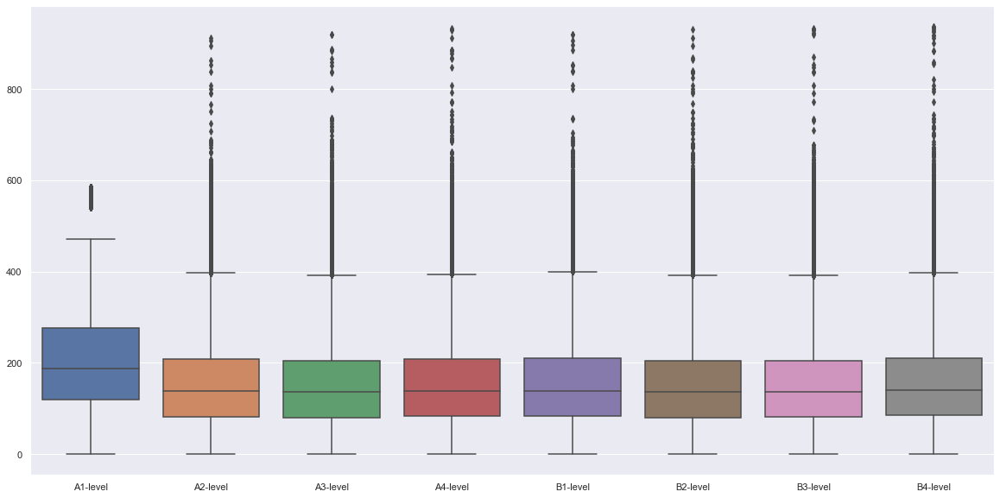

In [9]:
def check_out(df):
    # 外れ値確認
    num_cols = df.select_dtypes(include=["int", "int32", "int64", "float", "float32", "float64"]).columns.to_list()
    plt.figure(figsize=(20, 10))
    sns.boxplot(data=df[num_cols])
    plt.show()
    plt.clf()
    plt.close()
    
_df = df_all.copy().drop(["id", "y"], axis=1)
check_out(_df)

- A1-levelは外れ値ありそう

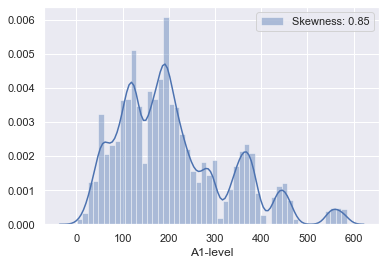

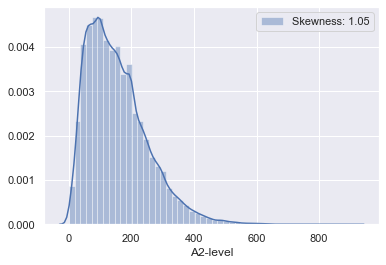

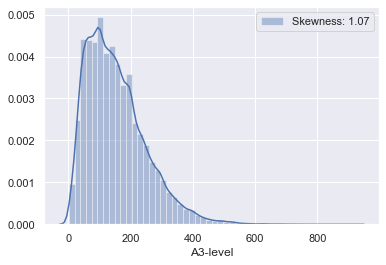

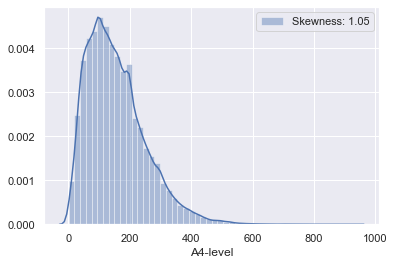

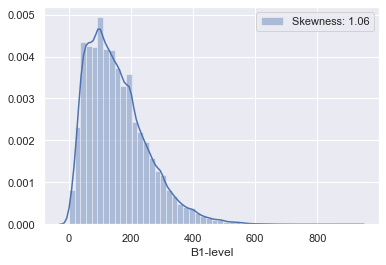

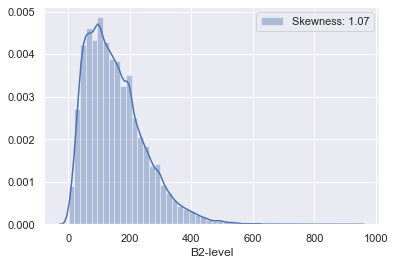

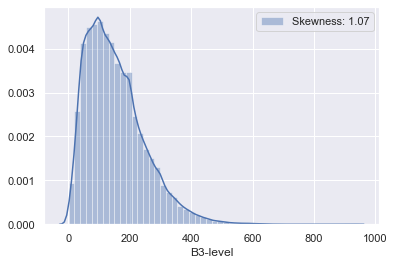

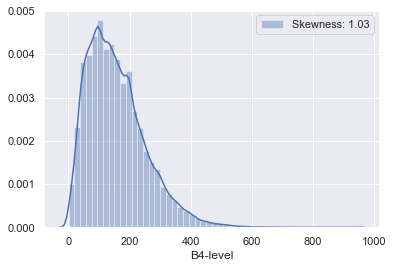

In [10]:
def check_num_hist(df):
    # 数値列のヒストグラム。歪み（Skewness）大きい場合は対数変換した方が良い
    num_cols = df.select_dtypes(include=["int", "int32", "int64", "float", "float32", "float64"]).columns.to_list()
    for col in num_cols:
        try:
            _ser = df[col].dropna()
            sns.distplot(_ser, label=f"Skewness: {round(_ser.skew(), 2)}")
            plt.legend()
            plt.show()
            plt.clf()
            plt.close()
        except Exception as e:
            print(e)
            print(f"ERROR: {col}")

_df = df_all.copy().drop(["id", "y"], axis=1)
check_num_hist(_df)

- A2-level, A3-level, A4-level, B1-level, B2-level, B3-level, B4-level は対数化した方が良いかも

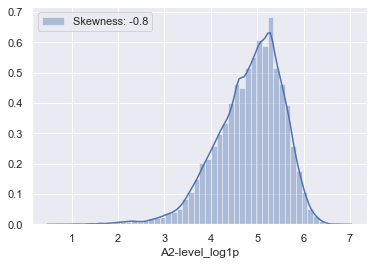

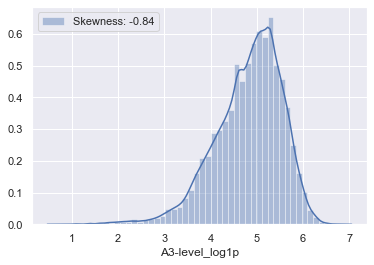

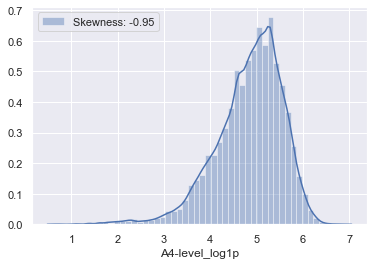

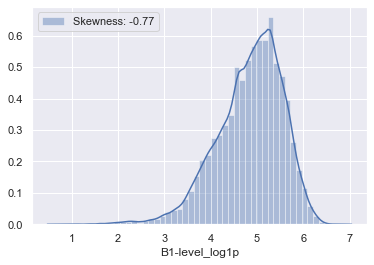

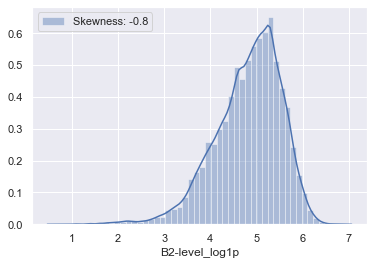

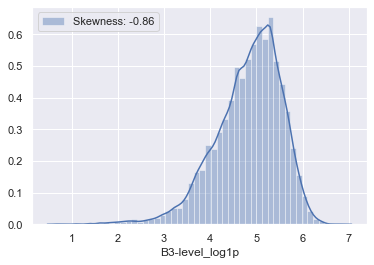

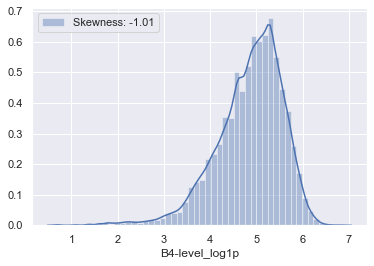

In [11]:
def log1p(df, num_cols):
    for col in num_cols:
        df[f"{col}_log1p"] = np.log(df[col] + 1)
    return df

log1p_cols = ["A2-level", "A3-level", "A4-level", "B1-level", "B2-level", "B3-level", "B4-level"]
df_all = log1p(df_all, log1p_cols)

new_log1p_cols = [f"{c}_log1p" for c in log1p_cols]
check_num_hist(df_all[new_log1p_cols])

- 歪度あまり改善しなので対数化しても意味なさそう

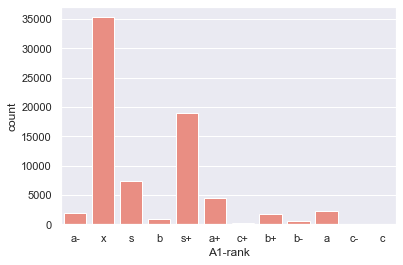

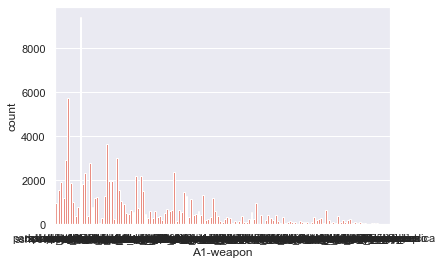

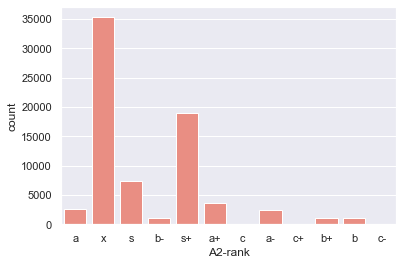

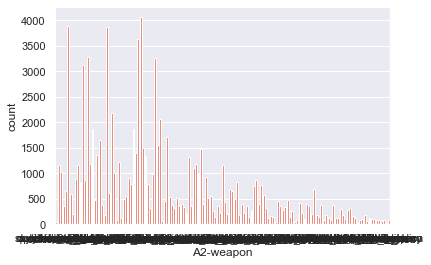

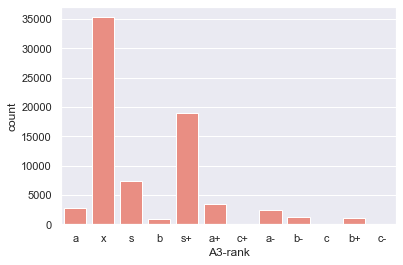

...

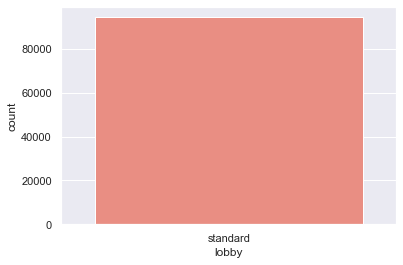

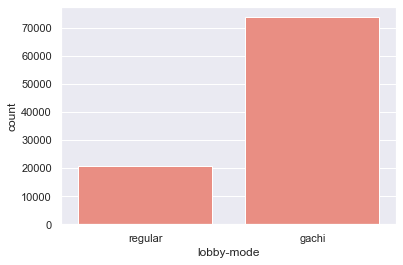

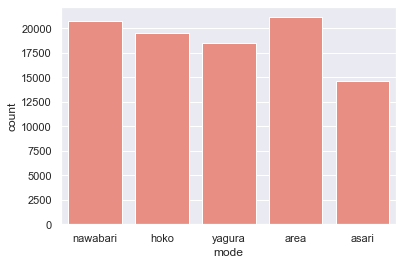

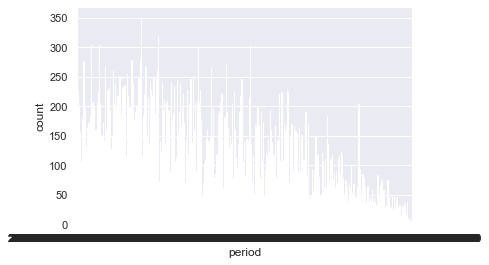

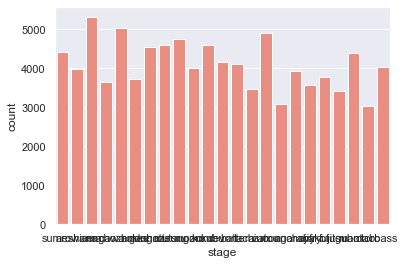

In [12]:
def check_cate_count(df):
    # カテゴリ列のレコード数
    cate_cols = df.select_dtypes(include=["object", "category", "bool"]).columns.to_list()
    for col in cate_cols:
        sns.countplot(x=col, data=df, color='salmon')
        plt.show()
        plt.clf()
        plt.close()
        
check_cate_count(df_all)

- 値がすべて同じ game-ver, lobbyは消しとくか

In [13]:
df_all = df_all.drop(["game-ver", "lobby"], axis=1)

- trainとtestの期間はごちゃ混ぜか？

In [14]:
train_df['period'] = pd.to_datetime(train_df['period'], format='%Y-%m-%d %H:%M:%S')
test_df['period'] = pd.to_datetime(test_df['period'], format='%Y-%m-%d %H:%M:%S')
df_all['period'] = pd.to_datetime(df_all['period'], format='%Y-%m-%d %H:%M:%S')

train_df = train_df.set_index('period', drop=False)
test_df = test_df.set_index('period', drop=False)
df_all = df_all.set_index('period', drop=False)

def time_cols(df, date_col):
    df[date_col] = pd.to_datetime(df[date_col]) # dtype を datetime64 に変換
    df['year'] = df[date_col].dt.year
    df['month'] = df[date_col].dt.month
    df['day'] = df[date_col].dt.day
    df['dayofyear'] = df[date_col].dt.dayofyear
    df['dayofweek'] = df[date_col].dt.dayofweek
    df['weekend'] = (df[date_col].dt.dayofweek.values >= 5).astype(int)
    df['hour'] = df[date_col].dt.hour
    return df

train_df = time_cols(train_df, 'period')
test_df = time_cols(test_df, 'period')
df_all = time_cols(df_all, 'period')

display(df_all.head(1))

,A1-level,A1-rank,A1-weapon,A2-level,A2-rank,A2-weapon,A3-level,A3-rank,A3-weapon,A4-level,A4-rank,A4-weapon,B1-level,B1-rank,B1-weapon,B2-level,B2-rank,B2-weapon,B3-level,B3-rank,B3-weapon,B4-level,B4-rank,B4-weapon,id,lobby-mode,mode,period,stage,y,A2-level_log1p,A3-level_log1p,A4-level_log1p,B1-level_log1p,B2-level_log1p,B3-level_log1p,B4-level_log1p,year,month,day,dayofyear,dayofweek,weekend,hour
period,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-10-15 20:00:00+00:00,139,NaN,sshooter_becchu,118.0,NaN,soytuber_custom,13.0,NaN,pablo_hue,10.0,NaN,hokusai,28,NaN,bold_7,26.0,NaN,hokusai_becchu,68.0,NaN,herocharger_replica,31.0,NaN,sharp_neo,1,regular,nawabari,2019-10-15 20:00:00+00:00,sumeshi,1.0,4.779123,2.639057,2.397895,3.367296,3.295837,4.234107,3.465736,2019,10,15,288,1,0,20


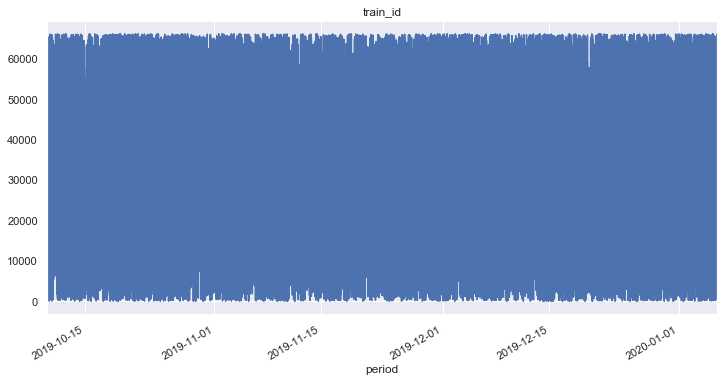

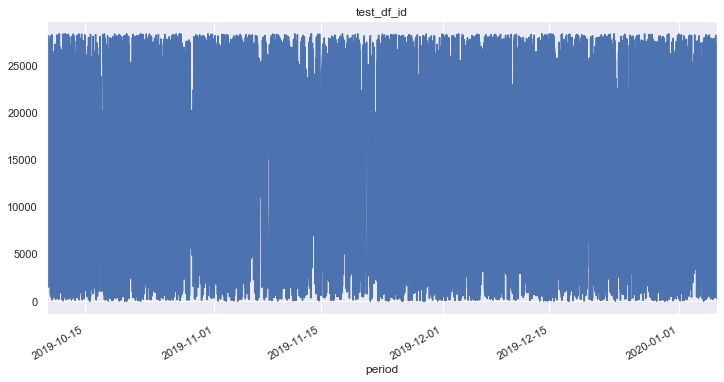

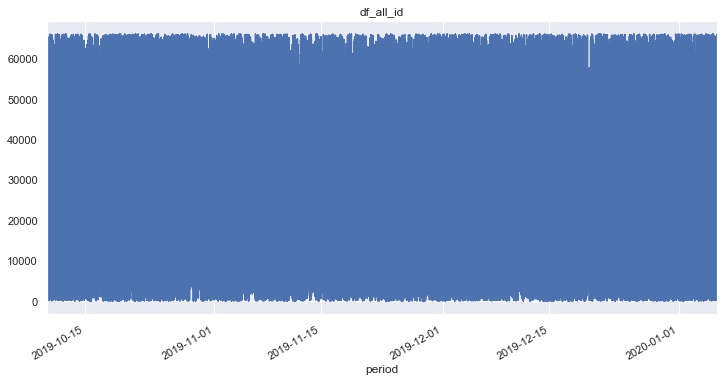

In [15]:
train_df["id"].plot(title="train_id", figsize=(12, 6))
plt.show()

test_df["id"].plot(title="test_df_id", figsize=(12, 6))
plt.show()

df_all["id"].plot(title="df_all_id", figsize=(12, 6))
plt.show()

- trainとtestの期間はごちゃ混ぜだった。cvは時系列のやり方で分けなくて良さそう

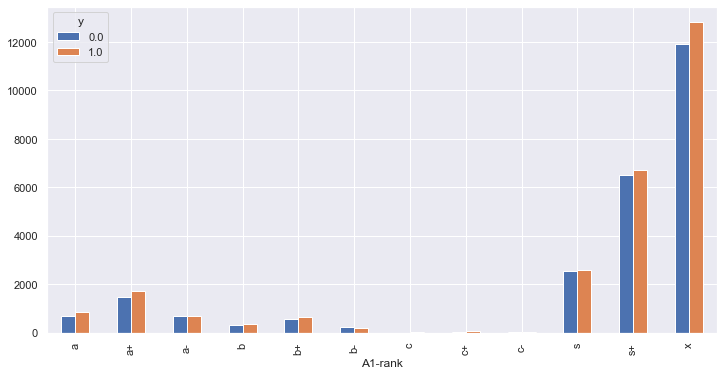

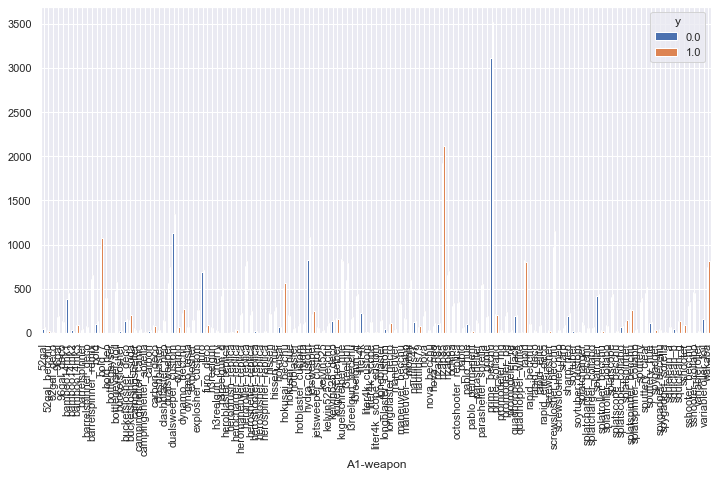

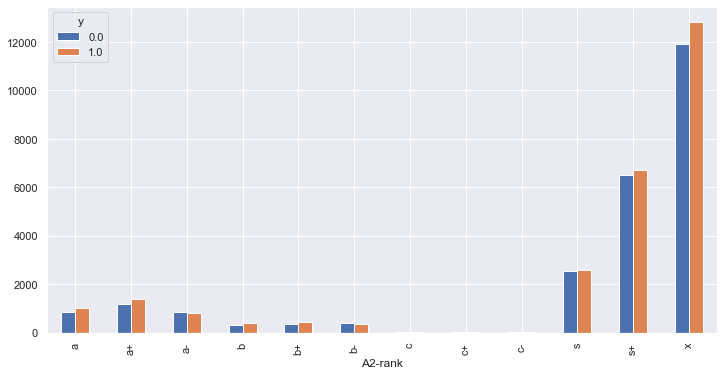

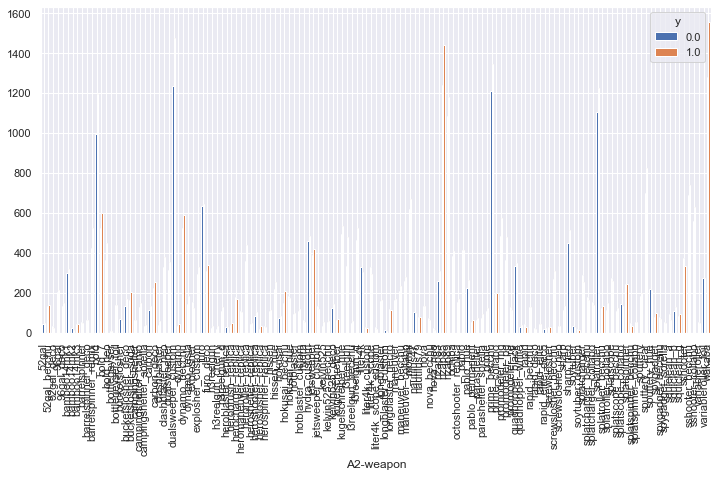

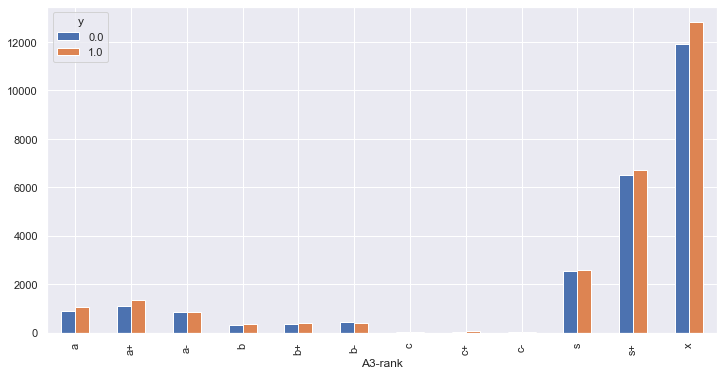

...

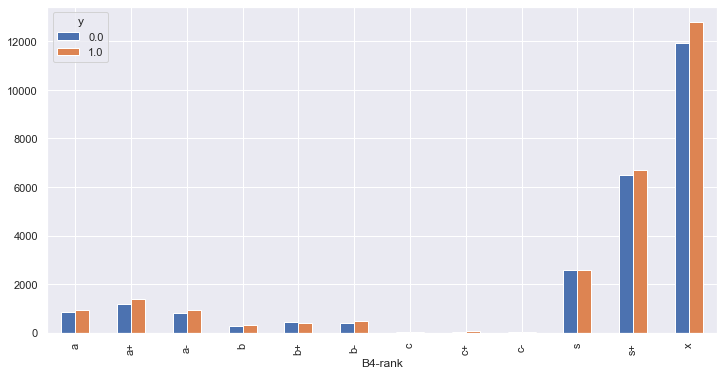

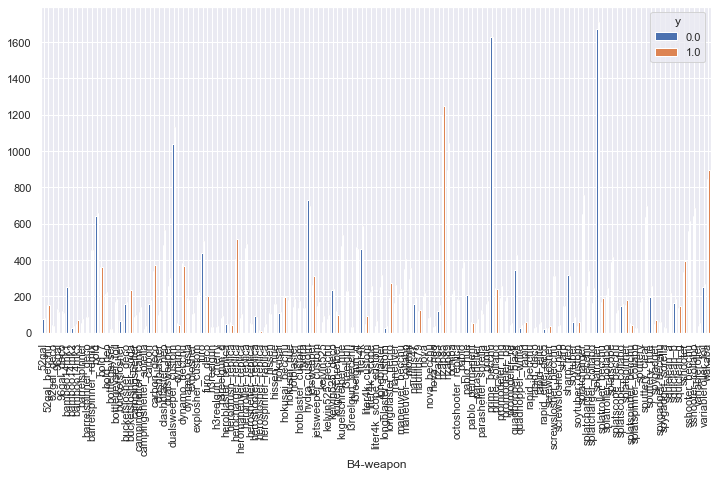

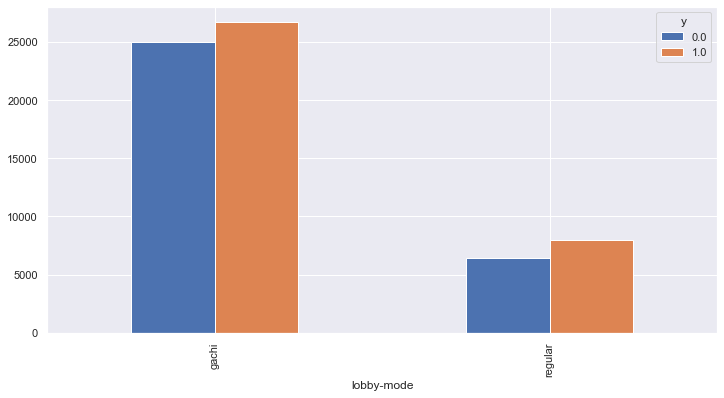

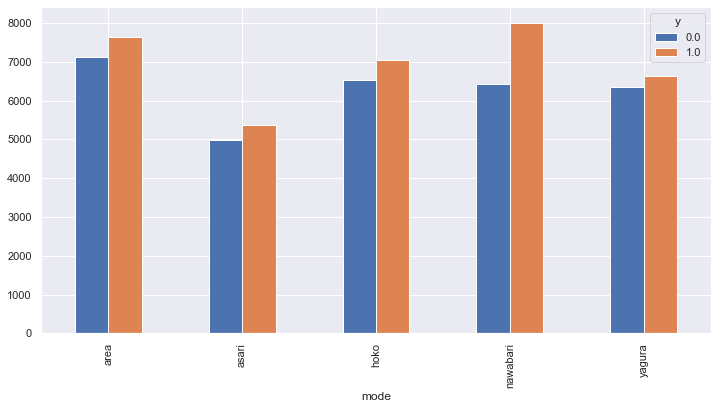

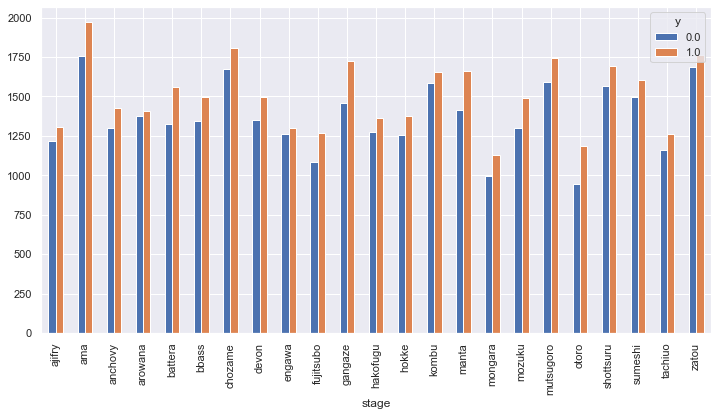

In [17]:
# カテゴリ列 vs. カテゴリ列。これは１列ごとに見てかないと理解できない
# countの場合は valuesはどの列選んでも同じ。columnsとindexが一意なレコードの数数える
str_cols = df_all.select_dtypes(include=["object", "category", "bool"]).columns.to_list()
for col in str_cols:
    _df = df_all.pivot_table(values="id", index=col, columns="y", aggfunc="count",)
    _df.plot.bar(figsize=(12, 6))
    plt.show()
    plt.clf()
    plt.close()

- rankによる勝ち負けの差は大きくはなさそう
- 武器によって勝ち負けの差大きそう
- mode違いで勝ち負けの差は少しありそう
- ステージ違いで勝ち負けの差は大きくはなさそう

In [16]:
df_all["y"].value_counts()

1.0    34696
0.0    31429
Name: y, dtype: int64

- ラベル不均衡でない

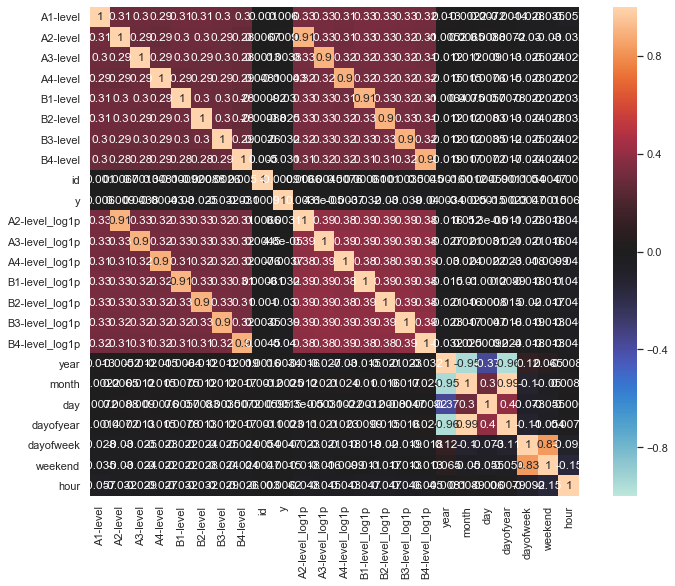

In [17]:
# 特徴量同士の相関ヒートマップ
fig, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(df_all.corr(), square=True, vmax=1, vmin=-1, center=0, annot=True)
plt.show()

- 元々の列で相関明らかに高い列はない

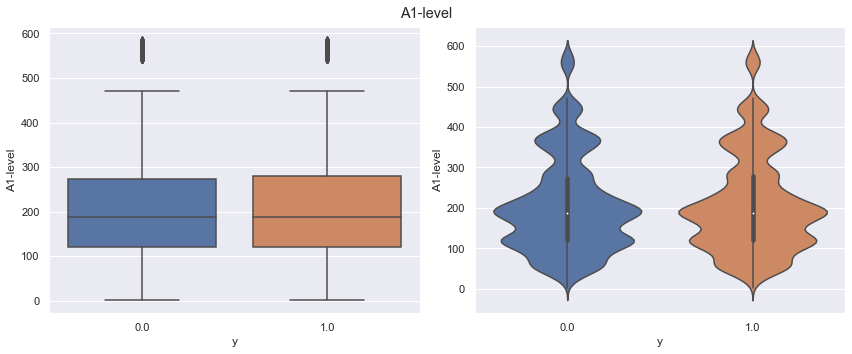

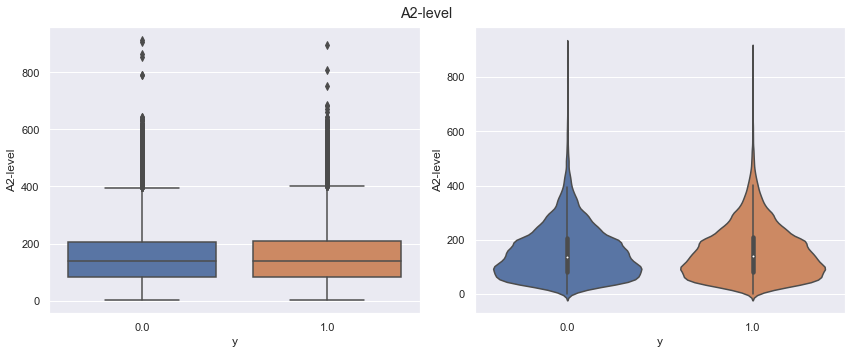

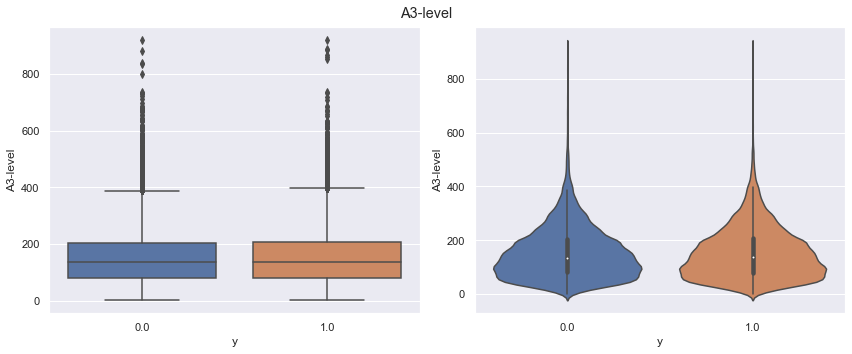

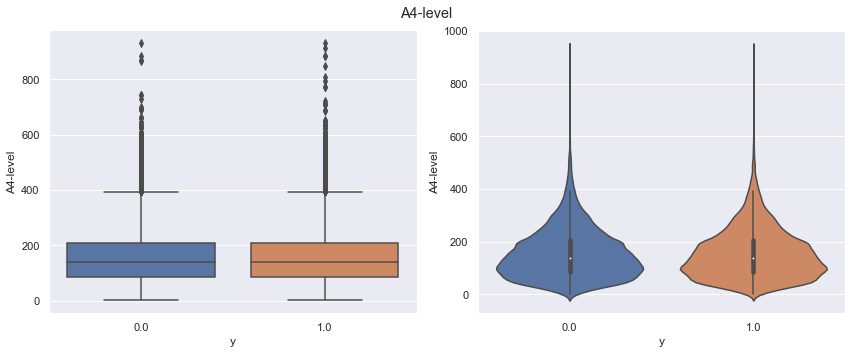

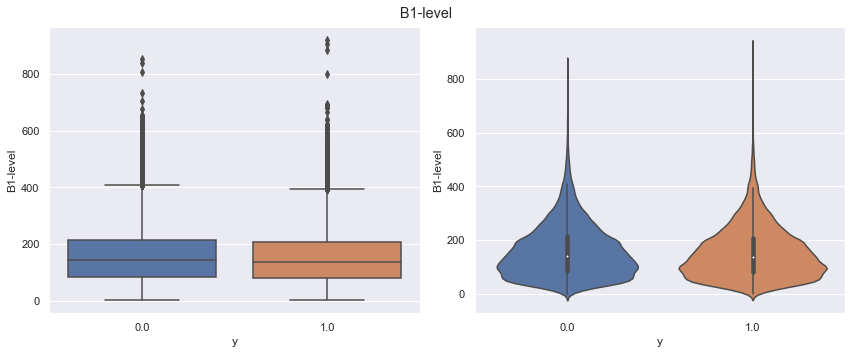

...

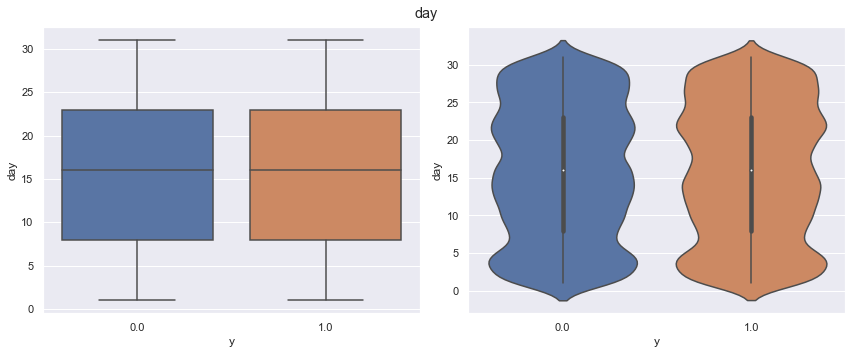

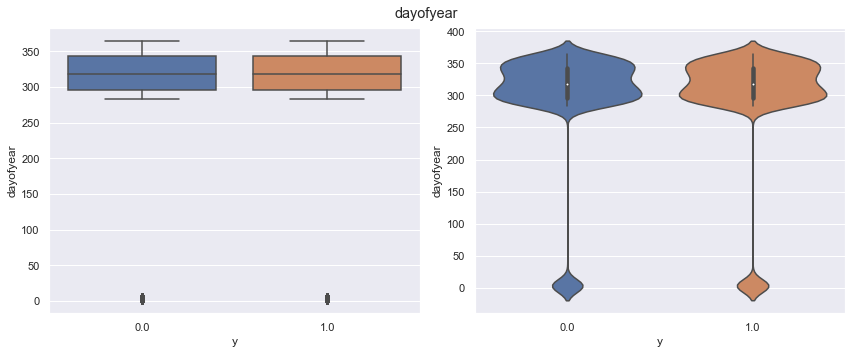

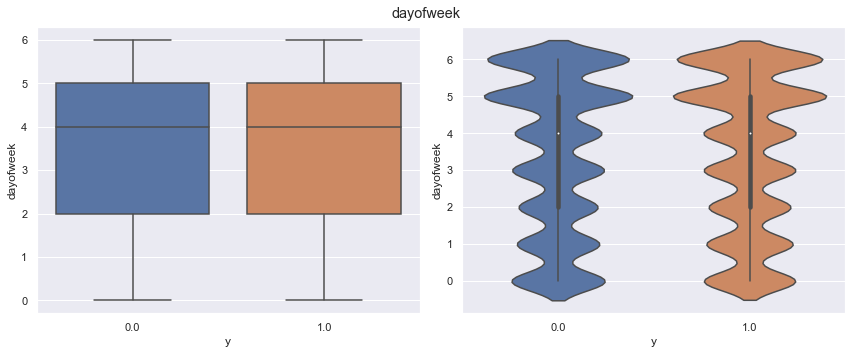

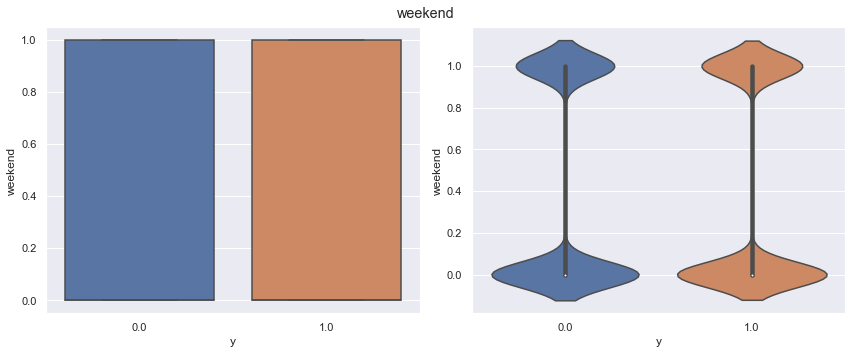

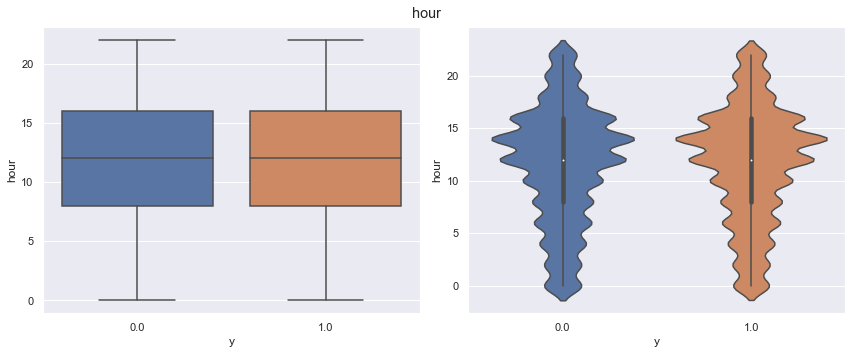

In [18]:
# カテゴリ列 vs. 複数の数値列
cate_col = "y"
num_columns = df_all.select_dtypes(include=["int", "int32", "int64", "float", "float32", "float64"]).columns.to_list()

for i, n_col in enumerate(num_columns):
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(n_col)
    sns.boxplot(x=cate_col, y=n_col, data=df_all, ax=ax[0])
    sns.violinplot(x=cate_col, y=n_col, data=df_all, ax=ax[1])
    plt.tight_layout(rect=[0,0,1,0.96])  # タイトル重ならないようにする
    plt.show()
    plt.clf()
    plt.close()

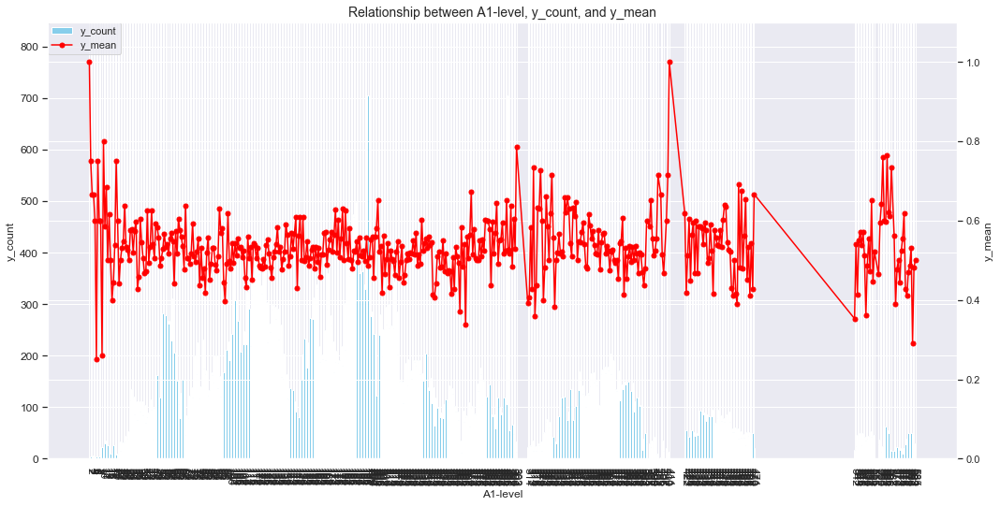

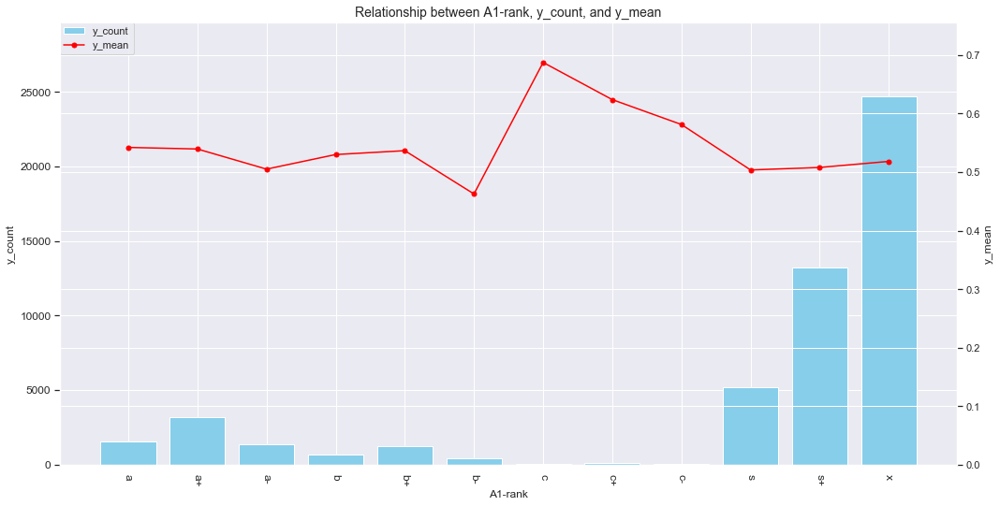

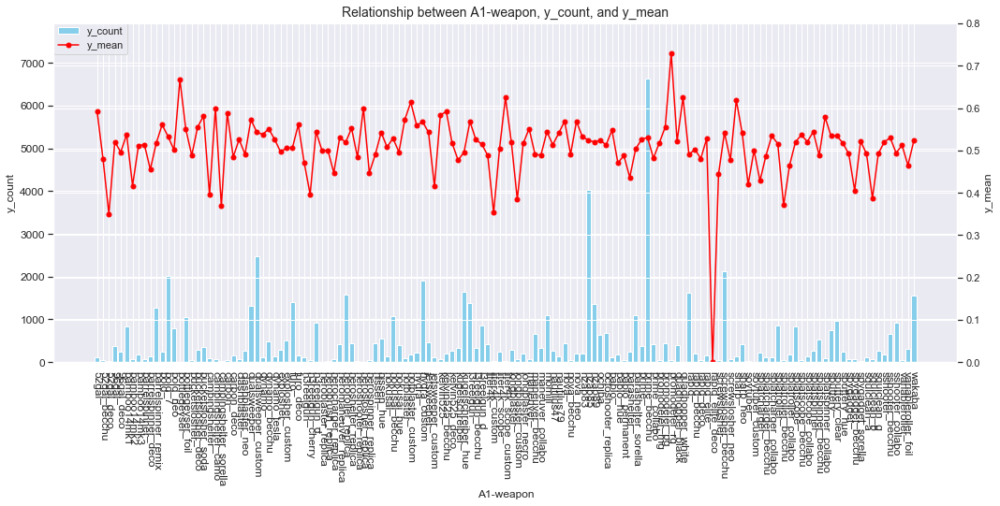

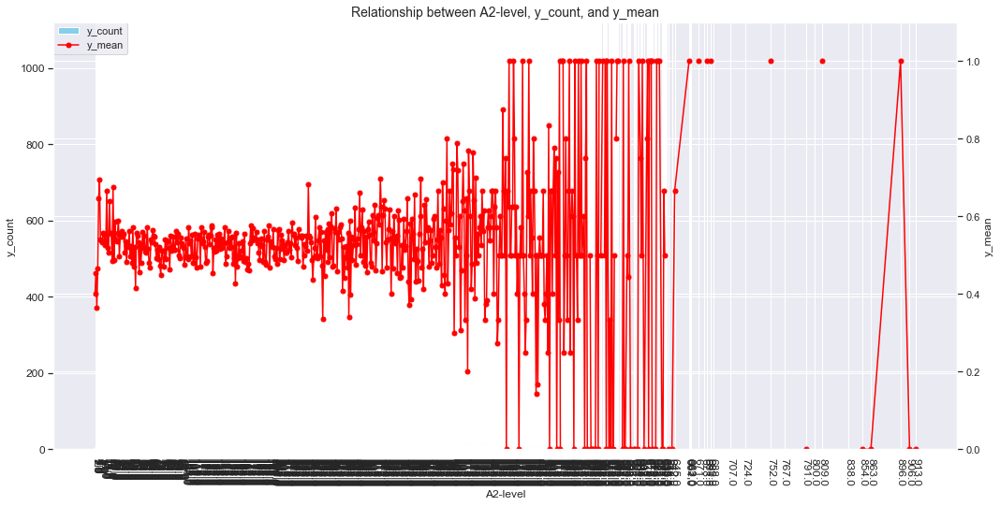

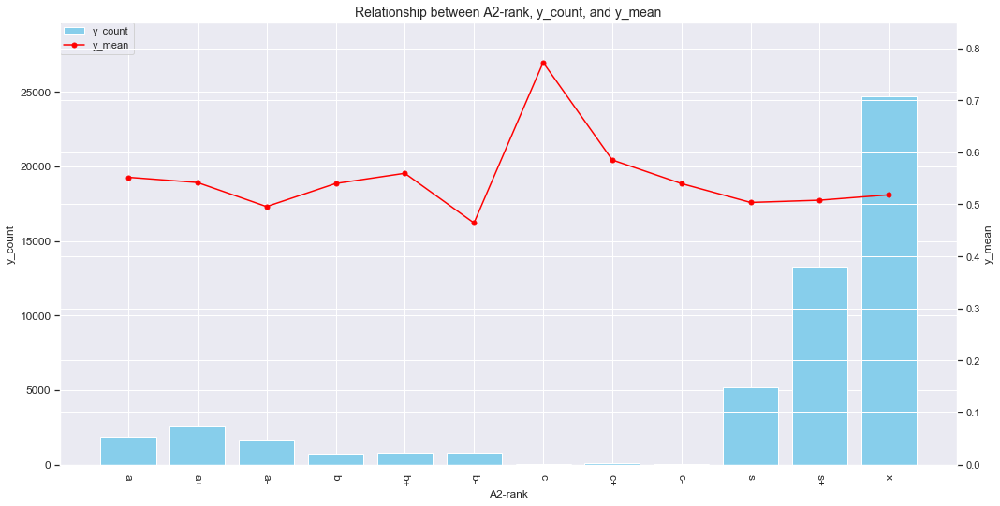

...

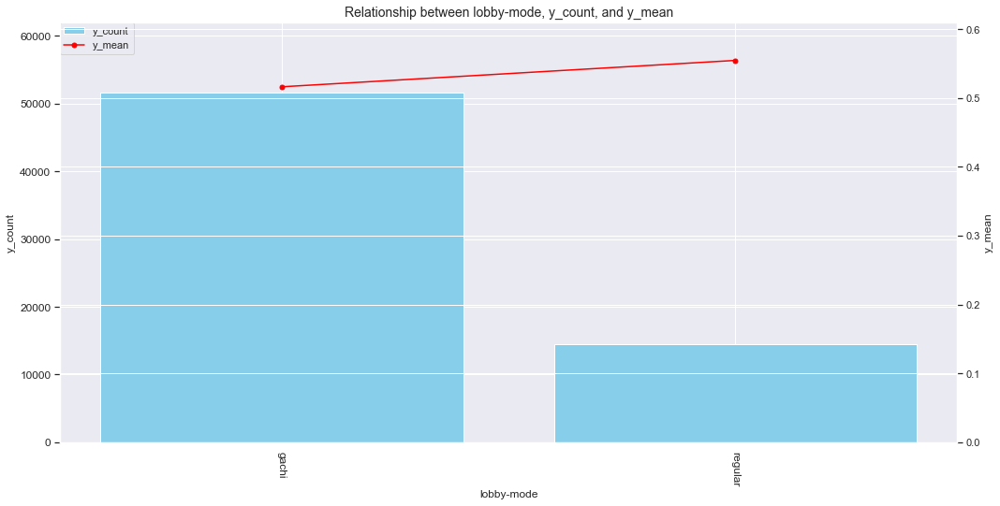

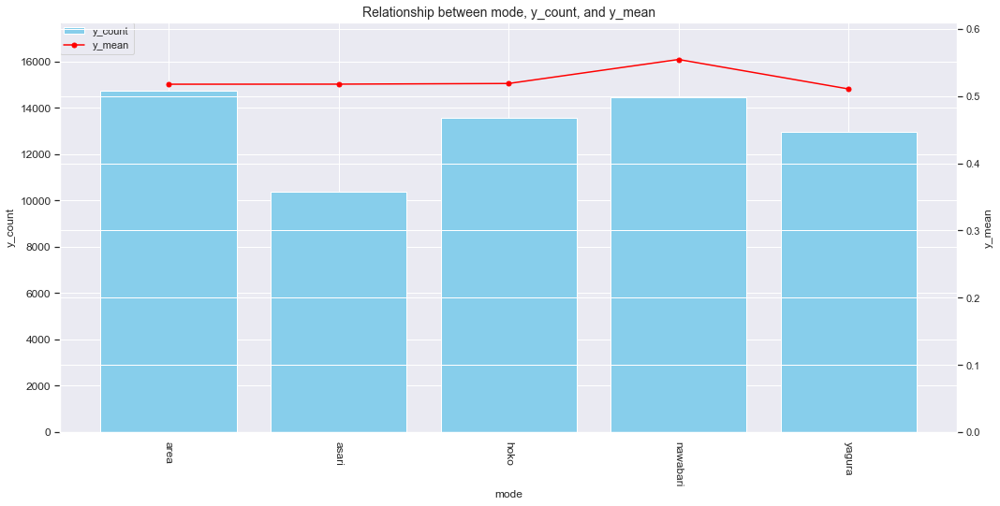

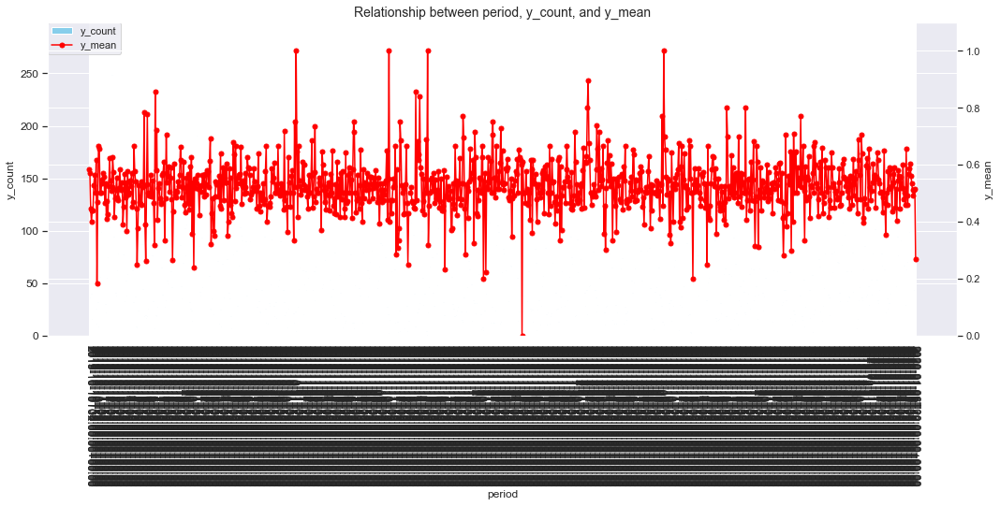

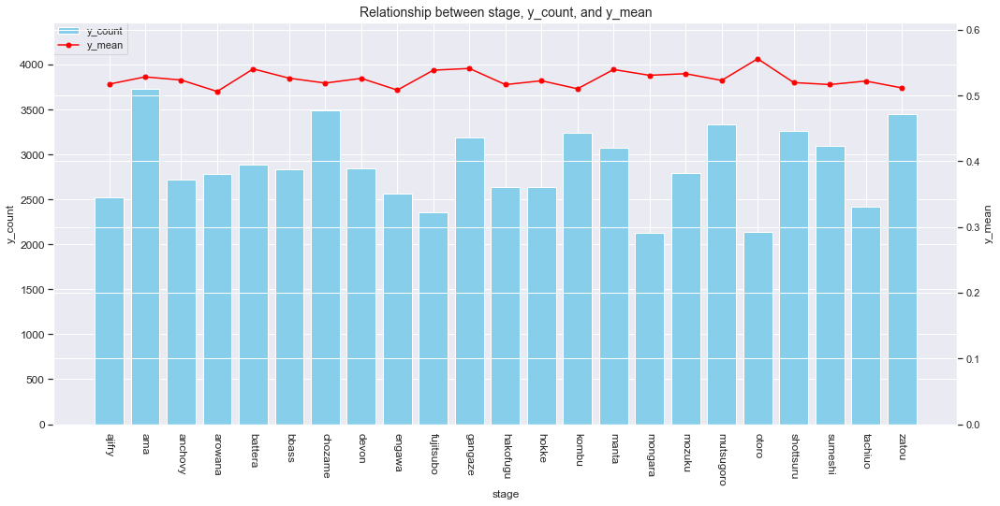

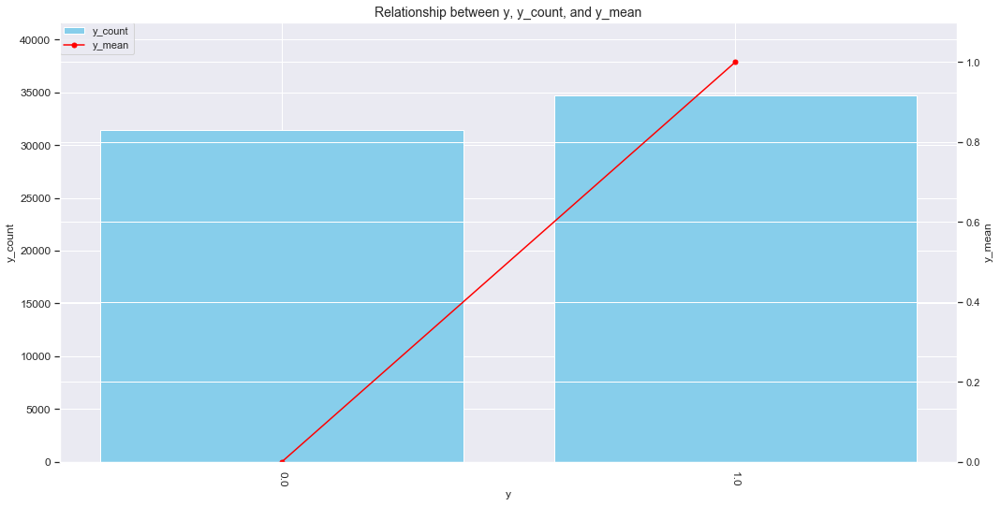

In [5]:
def grouping(df, cols, agg_dict, prefix=""):
    """特定のカラムについてgroup化された特徴量の作成を行う
    Args:
        df (pd.DataFrame): 特徴量作成のもととなるdataframe
        cols (str or list): group by処理のkeyとなるカラム (listで複数指定可能)
        agg_dict (dict): 特徴量作成を行いたいカラム/集計方法を指定するdictionary
        prefix (str): 集約後のカラムに付与するprefix name

    Returns:
        df (pd.DataFrame): 特定のカラムについてgroup化された特徴量群
    """
    group_df = df.groupby(cols).agg(agg_dict)
    group_df.columns = [prefix + c[0] + "_" + c[1] for c in list(group_df.columns)]
    group_df.reset_index(inplace=True)

    return group_df


def plot_target_stats(df, col, agg_dict, plot_config, figsize=(15, 8)):
    """指定したカラムとtargetの関係を可視化する
    Args:
        df (pd.DataFrame): 可視化したい特徴量作成のもととなるdataframe
        col (str): group by処理のkeyとなるカラム
        agg_dict (dict): 特徴量作成を行いたいカラム/集計方法を指定するdictionary

    """

    plt_data = grouping(df, col, agg_dict, prefix="")

    target_col = list(agg_dict.keys())[0]

    # 2軸グラフの作成
    fig, ax1 = plt.subplots(figsize=figsize)

    ax2 = ax1.twinx()

    ax1.bar(
        plt_data[col],
        plt_data[f"{target_col}_count"],
        label=f"{target_col}_count",
        color="skyblue",
        **plot_config["bar"],
    )
    ax2.plot(
        plt_data[col],
        plt_data[f"{target_col}_mean"],
        label=f"{target_col}_mean",
        color="red",
        marker=".",
        markersize=10,
    )

    h1, label1 = ax1.get_legend_handles_labels()
    h2, label2 = ax2.get_legend_handles_labels()

    ax1.legend(h1 + h2, label1 + label2, loc=2, borderaxespad=0.0)
    ax1.set_xticks(plt_data[col])
    ax1.set_xticklabels(plt_data[col], rotation=-90, fontsize=10)

    ax1.set_title(
        f"Relationship between {col}, {target_col}_count, and {target_col}_mean",
        fontsize=14,
    )
    ax1.set_xlabel(f"{col}")
    ax1.tick_params(labelsize=12)

    ax1.set_ylabel(f"{target_col}_count")
    ax2.set_ylabel(f"{target_col}_mean")

    ax1.set_ylim([0, plt_data[f"{target_col}_count"].max() * 1.2])
    ax2.set_ylim([0, plt_data[f"{target_col}_mean"].max() * 1.1])

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # タイトル重ならないようにする
    plt.show()
    plt.clf()
    plt.close()

# 各カラムごとのレコード数と数値型の目的変数の平均値を可視化
target_col = "y"
for col in df_all.columns.to_list():
    agg_dict = {target_col: ["count", "mean"]}
    
    plot_config = {"bar": {"width": 0.8}}
    plot_target_stats(df_all, col, agg_dict, plot_config)

- レベル高いレコードは少ないので平均の値が極端
- A1,A2,A3,A4,B1,B2,B3,B4それぞれレベルの分布が違う。A1はレベル高いレコード多めだが、ほかのはレベル高いのは少ない。雑魚狩りせずにA1に上がるから？

C:\Users\81908\Anaconda3\envs\tfgpu\lib\site-packages\statsmodels\nonparametric\kde.py:447: RuntimeWarning: invalid value encountered in greater
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.
C:\Users\81908\Anaconda3\envs\tfgpu\lib\site-packages\statsmodels\nonparametric\kde.py:447: RuntimeWarning: invalid value encountered in less
  X = X[np.logical_and(X > clip[0], X < clip[1])] # won't work for two columns.


<Figure size 432x288 with 0 Axes>

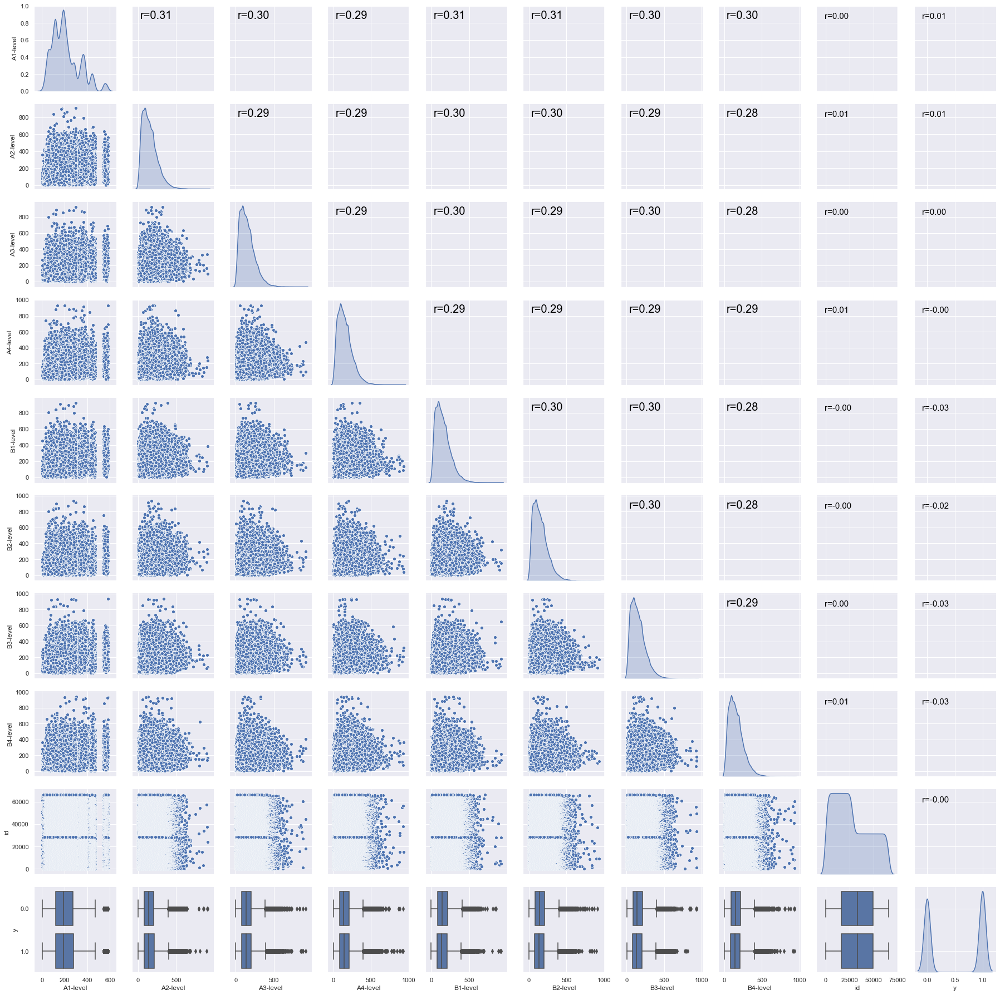

In [6]:
def c_pairplot(df):
    # カスタムペアプロット
    import sys
    sys.path.append(r'C:\Users\81908\Git\seaborn_analyzer')

    from custom_pair_plot import CustomPairPlot
    # 行数列数多いと処理終わらないので注意
    num_columns = df.select_dtypes(include=["int", "int32", "int64", "float", "float32", "float64"]).columns.to_list()
    CustomPairPlot().pairanalyzer(df[num_columns])  # dfでも実行できる
    plt.show()
    
c_pairplot(df_all)

# 特徴量追加

In [18]:
# データ再取得
train_df = pd.read_csv(f"{ORIG}/train_data.csv")
test_df = pd.read_csv(f"{ORIG}/test_data.csv")
df_all = train_df.append(test_df).reset_index(drop=True)

In [19]:
# 上のセルでやった列追加削除

def time_cols(df, date_col):
    df[date_col] = pd.to_datetime(df[date_col]) # dtype を datetime64 に変換
    # 期間短いから週と時間だけにしておく
    #df['year'] = df[date_col].dt.year
    #df['month'] = df[date_col].dt.month
    #df['day'] = df[date_col].dt.day
    #df['dayofyear'] = df[date_col].dt.dayofyear
    df['dayofweek'] = df[date_col].dt.dayofweek
    df['weekend'] = (df[date_col].dt.dayofweek.values >= 5).astype(int)
    df['hour'] = df[date_col].dt.hour
    return df


def log1p(df, num_cols):
    for col in num_cols:
        df[f"{col}_log1p"] = np.log(df[col] + 1)
    return df


log1p_cols = ["A2-level", "A3-level", "A4-level", "B1-level", "B2-level", "B3-level", "B4-level"]
df_all = log1p(df_all, log1p_cols)

df_all['period'] = pd.to_datetime(df_all['period'], format='%Y-%m-%d %H:%M:%S')
df_all = df_all.set_index('period', drop=False)
df_all = time_cols(df_all, 'period')

# 不要な列削除
df_all = df_all.drop(["id", 'period', "game-ver", "lobby"], axis=1)
df_all

,A1-level,A1-rank,A1-weapon,A2-level,A2-rank,A2-weapon,A3-level,A3-rank,A3-weapon,A4-level,A4-rank,A4-weapon,B1-level,B1-rank,B1-weapon,B2-level,B2-rank,B2-weapon,B3-level,B3-rank,B3-weapon,B4-level,B4-rank,B4-weapon,lobby-mode,mode,stage,y,A2-level_log1p,A3-level_log1p,A4-level_log1p,B1-level_log1p,B2-level_log1p,B3-level_log1p,B4-level_log1p,dayofweek,weekend,hour
period,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-10-15 20:00:00+00:00,139,NaN,sshooter_becchu,118.0,NaN,soytuber_custom,13.0,NaN,pablo_hue,10.0,NaN,hokusai,28,NaN,bold_7,26.0,NaN,hokusai_becchu,68.0,NaN,herocharger_replica,31.0,NaN,sharp_neo,regular,nawabari,sumeshi,1.0,4.779123,2.639057,2.397895,3.367296,3.295837,4.234107,3.465736,1,0,20
2019-12-14 04:00:00+00:00,198,NaN,parashelter_sorella,77.0,NaN,jetsweeper,198.0,NaN,campingshelter_camo,123.0,NaN,nzap85,83,NaN,momiji,118.0,NaN,squiclean_b,168.0,NaN,campingshelter,151.0,NaN,sputtery_clear,regular,nawabari,arowana,0.0,4.356709,5.293305,4.820282,4.430817,4.779123,5.129899,5.023881,5,1,4
2019-12-25 14:00:00+00:00,114,a-,nzap89,68.0,a,quadhopper_black,225.0,a,prime_becchu,107.0,a,jetsweeper,50,a-,bold_7,163.0,a+,nzap85,160.0,a-,prime_becchu,126.0,a,dualsweeper_custom,gachi,hoko,ama,0.0,4.234107,5.420535,4.682131,3.931826,5.099866,5.081404,4.844187,2,0,14
2019-11-11 14:00:00+00:00,336,NaN,bamboo14mk1,131.0,NaN,splatroller_becchu,189.0,NaN,dynamo_tesla,41.0,NaN,prime_becchu,273,NaN,splatcharger_becchu,189.0,NaN,liter4k,194.0,NaN,promodeler_mg,391.0,NaN,hotblaster_custom,regular,nawabari,engawa,0.0,4.882802,5.247024,3.737670,5.613128,5.247024,5.273000,5.971262,0,0,14
2019-12-14 06:00:00+00:00,299,x,bold_7,97.0,x,hissen_hue,96.0,x,h3reelgun_d,136.0,x,splatroller,101,x,furo,45.0,x,sputtery_hue,246.0,x,bucketslosher_soda,160.0,x,wakaba,gachi,hoko,chozame,1.0,4.584967,4.574711,4.919981,4.624973,3.828641,5.509388,5.081404,5,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-10-11 16:00:00+00:00,67,x,prime_becchu,62.0,x,splatroller,136.0,x,bold,131.0,x,furo,139,x,longblaster_custom,152.0,x,hissen,240.0,x,prime_becchu,150.0,x,nzap83,gachi,yagura,battera,NaN,4.143135,4.919981,4.882802,4.941642,5.030438,5.484797,5.017280,4,0,16
2019-10-20 12:00:00+00:00,25,c-,longblaster_necro,18.0,c-,splatroller_collabo,19.0,c,quadhopper_black,18.0,c-,bold,10,c-,hokusai,18.0,c,bamboo14mk1,17.0,c-,nzap89,35.0,c+,dualsweeper,gachi,yagura,anchovy,NaN,2.944439,2.995732,2.944439,2.397895,2.944439,2.890372,3.583519,6,1,12
2019-12-14 00:00:00+00:00,386,x,furo,136.0,x,kugelschreiber,198.0,x,heroroller_replica,512.0,x,clashblaster_neo,62,x,rapid_becchu,250.0,x,bamboo14mk1,257.0,x,carbon_deco,243.0,x,l3reelgun_d,gachi,yagura,zatou,NaN,4.919981,5.293305,6.240276,4.143135,5.525453,5.552960,5.497168,5,1,0


,feature,y_corr
14,B4-level_log1p,0.040
829,B1-levelB3-level_plus,0.039
13,B3-level_log1p,0.039
833,B3-levelB4-level_plus,0.039
830,B1-levelB4-level_plus,0.038
832,B2-levelB4-level_plus,0.035
831,B2-levelB3-level_plus,0.035
828,B1-levelB2-level_plus,0.034
845,A2-levelB3-level_minus,0.034
843,A2-levelB1-level_minus,0.033


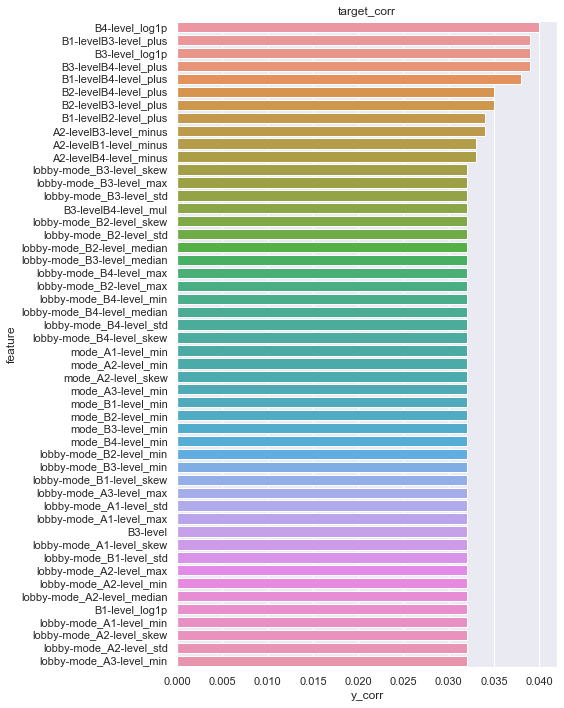

In [31]:
def target_corr(df, target_col="y", png_path=None):
    """目的変数との数値列との相関係数確認"""
    num_cols = df.select_dtypes(include=["int", "int32", "int64", "float", "float32", "float64"]).columns.to_list()
    if target_col in num_cols:
        num_cols.remove(target_col)
    corrs = []
    for col in num_cols:
        s1 = df[col]
        s2 = df[target_col]
        corr = s1.corr(s2)
        corrs.append(abs(round(corr, 3)))
        
    df_corr = pd.DataFrame({"feature": num_cols, "y_corr": corrs}).sort_values(by='y_corr', ascending=False)
    
    plt.figure(figsize=(8, 10))
    sns.barplot(
        x="y_corr",
        y="feature",
        data=df_corr.head(50),
    )
    plt.title(f"target_corr")
    plt.tight_layout()
    if png_path is not None:
        plt.savefig(png_path)
        
    return df_corr
        
    
target_corr(df_all, target_col="y")

In [21]:
# base_cate_cols = df_all.select_dtypes(include=["object", "category", "bool"]).columns.to_list()
base_cate_cols = ["A1-rank", "A1-weapon", "A2-rank", "A2-weapon", "A3-rank", "A3-weapon", "A4-rank", "A4-weapon", 
                  "B1-rank", "B1-weapon", "B2-rank", "B2-weapon", "B3-rank", "B3-weapon", "B4-rank", "B4-weapon",
                  "lobby-mode", "mode", "stage",]

In [22]:
def add_cate(df, cat_features):
    # 文字列を2列結合
    for col1, col2 in tqdm(itertools.combinations(cat_features, 2)):
        new_col_name = '_'.join([col1, col2])
        new_values = df[col1].map(str) + "_" + df[col2].map(str)
        #encoder = preprocessing.LabelEncoder()
        df[new_col_name] = new_values# encoder.fit_transform(new_values)

    return df

df_all = add_cate(df_all, base_cate_cols)
display(df_all)

171it [00:05, 31.42it/s]


,A1-level,A1-rank,A1-weapon,A2-level,A2-rank,A2-weapon,A3-level,A3-rank,A3-weapon,A4-level,A4-rank,A4-weapon,B1-level,B1-rank,B1-weapon,B2-level,B2-rank,B2-weapon,B3-level,B3-rank,B3-weapon,B4-level,B4-rank,B4-weapon,lobby-mode,mode,stage,y,A2-level_log1p,A3-level_log1p,A4-level_log1p,B1-level_log1p,B2-level_log1p,B3-level_log1p,B4-level_log1p,dayofweek,weekend,hour,A1-rank_A1-weapon,A1-rank_A2-rank,A1-rank_A2-weapon,A1-rank_A3-rank,A1-rank_A3-weapon,A1-rank_A4-rank,A1-rank_A4-weapon,A1-rank_B1-rank,A1-rank_B1-weapon,A1-rank_B2-rank,A1-rank_B2-weapon,A1-rank_B3-rank,A1-rank_B3-weapon,A1-rank_B4-rank,A1-rank_B4-weapon,A1-rank_lobby-mode,A1-rank_mode,A1-rank_stage,A1-weapon_A2-rank,A1-weapon_A2-weapon,A1-weapon_A3-rank,A1-weapon_A3-weapon,A1-weapon_A4-rank,A1-weapon_A4-weapon,A1-weapon_B1-rank,A1-weapon_B1-weapon,A1-weapon_B2-rank,A1-weapon_B2-weapon,A1-weapon_B3-rank,A1-weapon_B3-weapon,A1-weapon_B4-rank,A1-weapon_B4-weapon,A1-weapon_lobby-mode,A1-weapon_mode,A1-weapon_stage,A2-rank_A2-weapon,A2-rank_A3-rank,A2-rank_A3-weapon,A2-rank_A4-rank,A2-rank_A4-weapon,A2-rank_B1-rank,A2-rank_B1-weapon,A2-rank_B2-rank,A2-rank_B2-weapon,A2-rank_B3-rank,A2-rank_B3-weapon,A2-rank_B4-rank,A2-rank_B4-weapon,A2-rank_lobby-mode,A2-rank_mode,A2-rank_stage,A2-weapon_A3-rank,A2-weapon_A3-weapon,A2-weapon_A4-rank,A2-weapon_A4-weapon,A2-weapon_B1-rank,A2-weapon_B1-weapon,A2-weapon_B2-rank,A2-weapon_B2-weapon,A2-weapon_B3-rank,A2-weapon_B3-weapon,A2-weapon_B4-rank,A2-weapon_B4-weapon,A2-weapon_lobby-mode,A2-weapon_mode,A2-weapon_stage,A3-rank_A3-weapon,A3-rank_A4-rank,A3-rank_A4-weapon,A3-rank_B1-rank,A3-rank_B1-weapon,A3-rank_B2-rank,A3-rank_B2-weapon,A3-rank_B3-rank,A3-rank_B3-weapon,A3-rank_B4-rank,A3-rank_B4-weapon,A3-rank_lobby-mode,A3-rank_mode,A3-rank_stage,A3-weapon_A4-rank,A3-weapon_A4-weapon,A3-weapon_B1-rank,A3-weapon_B1-weapon,A3-weapon_B2-rank,A3-weapon_B2-weapon,A3-weapon_B3-rank,A3-weapon_B3-weapon,A3-weapon_B4-rank,A3-weapon_B4-weapon,A3-weapon_lobby-mode,A3-weapon_mode,A3-weapon_stage,A4-rank_A4-weapon,A4-rank_B1-rank,A4-rank_B1-weapon,A4-rank_B2-rank,A4-rank_B2-weapon,A4-rank_B3-rank,A4-rank_B3-weapon,A4-rank_B4-rank,A4-rank_B4-weapon,A4-rank_lobby-mode,A4-rank_mode,A4-rank_stage,A4-weapon_B1-rank,A4-weapon_B1-weapon,A4-weapon_B2-rank,A4-weapon_B2-weapon,A4-weapon_B3-rank,A4-weapon_B3-weapon,A4-weapon_B4-rank,A4-weapon_B4-weapon,A4-weapon_lobby-mode,A4-weapon_mode,A4-weapon_stage,B1-rank_B1-weapon,B1-rank_B2-rank,B1-rank_B2-weapon,B1-rank_B3-rank,B1-rank_B3-weapon,B1-rank_B4-rank,B1-rank_B4-weapon,B1-rank_lobby-mode,B1-rank_mode,B1-rank_stage,B1-weapon_B2-rank,B1-weapon_B2-weapon,B1-weapon_B3-rank,B1-weapon_B3-weapon,B1-weapon_B4-rank,B1-weapon_B4-weapon,B1-weapon_lobby-mode,B1-weapon_mode,B1-weapon_stage,B2-rank_B2-weapon,B2-rank_B3-rank,B2-rank_B3-weapon,B2-rank_B4-rank,B2-rank_B4-weapon,B2-rank_lobby-mode,B2-rank_mode,B2-rank_stage,B2-weapon_B3-rank,B2-weapon_B3-weapon,B2-weapon_B4-rank,B2-weapon_B4-weapon,B2-weapon_lobby-mode,B2-weapon_mode,B2-weapon_stage,B3-rank_B3-weapon,B3-rank_B4-rank,B3-rank_B4-weapon,B3-rank_lobby-mode,B3-rank_mode,B3-rank_stage,B3-weapon_B4-rank,B3-weapon_B4-weapon,B3-weapon_lobby-mode,B3-weapon_mode,B3-weapon_stage,B4-rank_B4-weapon,B4-rank_lobby-mode,B4-rank_mode,B4-rank_stage,B4-weapon_lobby-mode,B4-weapon_mode,B4-weapon_stage,lobby-mode_mode,lobby-mode_stage,mode_stage
period,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2019-10-15 20:00:00+00:00,139,NaN,sshooter_becchu,118.0,NaN,soytuber_custom,13.0,NaN,pablo_hue,10.0,NaN,hokusai,28,NaN,bold_7,26.0,NaN,hokusai_becchu,68.0,NaN,herocharger_replica,31.0,NaN,sharp_neo,regular,nawabari,sumeshi,1.0,4.779123,2.639057,2.397895,3.367296,3.295837,4.234107,3.465736,1,0,20,nan_sshooter_becchu,nan_nan,nan_soytuber_custom,nan_nan,nan_pablo_hue,nan_nan,nan_hokusai,nan_nan,nan_bold_7,nan_nan,nan_hokusai_b

In [23]:
# A列でグループして集計したB列は意味がありそうと仮説たててから統計値列作ること
# 目的変数をキーにして集計するとリークしたターゲットエンコーディングになるため説明変数同士で行うこと
def grouping(df, cols, agg_dict, prefix=""):
    """特定のカラムについてgroup化された特徴量の作成を行う
    Args:
        df (pd.DataFrame): 特徴量作成のもととなるdataframe
        cols (str or list): group by処理のkeyとなるカラム (listで複数指定可能)
        agg_dict (dict): 特徴量作成を行いたいカラム/集計方法を指定するdictionary
        prefix (str): 集約後のカラムに付与するprefix name

    Returns:
        df (pd.DataFrame): 特定のカラムについてgroup化された特徴量群
    """
    group_df = df.groupby(cols).agg(agg_dict)
    group_df.columns = [prefix + c[0] + "_" + c[1] for c in list(group_df.columns)]
    group_df.reset_index(inplace=True)

    return group_df

# 集計する数値列指定
value_agg = {
    'A1-level' : ['max', 'min', 'median', 'std', 'skew'],
    'A2-level' : ['max', 'min', 'median', 'std', 'skew'],
    'A3-level' : ['max', 'min', 'median', 'std', 'skew'],
    'A4-level' : ['max', 'min', 'median', 'std', 'skew'],
    'B1-level' : ['max', 'min', 'median', 'std', 'skew'],
    'B2-level' : ['max', 'min', 'median', 'std', 'skew'],
    'B3-level' : ['max', 'min', 'median', 'std', 'skew'],
    'B4-level' : ['max', 'min', 'median', 'std', 'skew'],
}
# グループ化するカテゴリ列でループ
for key in tqdm(base_cate_cols):
    feature_df = grouping(df_all, key, value_agg, prefix=key + "_")
    df_all = pd.merge(df_all, feature_df, how='left', on=key)    
display(df_all)

100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:34<00:00,  4.99s/it]


A1-level A1-rank            A1-weapon  A2-level A2-rank  \
0           139     NaN      sshooter_becchu     118.0     NaN   
1           198     NaN  parashelter_sorella      77.0     NaN   
2           114      a-               nzap89      68.0       a   
3           336     NaN          bamboo14mk1     131.0     NaN   
4           299       x               bold_7      97.0       x   
...         ...     ...                  ...       ...     ...   
94460        67       x         prime_becchu      62.0       x   
94461        25      c-    longblaster_necro      18.0      c-   
94462       386       x                 furo     136.0       x   
94463       185      s+      maneuver_becchu     103.0      s+   
94464       182       x          hokusai_hue     111.0       x   

                 A2-weapon  A3-level A3-rank            A3-weapon  A4-level  \
0          soytuber_custom      13.0     NaN            pablo_hue      10.0   
1               jetsweeper     198.0     NaN  campingshelter_camo     123.0   
2         quadhopper_black     225.0       a         prime_becchu     107.0   
3       splatroller_becchu     189.0     NaN         dynamo_tesla      41.0   
4               hissen_hue      96.0       x          h3reelgun_d     136.0   
...                    ...       ...     ...                  ...       ...   
94460          splatroller     136.0       x                 bold     131.0   
94461  splatroller_collabo      19.0       c     quadhopper_black      18.0   
94462       kugelschreiber     198.0       x   heroroller_replica     512.0   
94463               wakaba     202.0      s+                 furo     477.0   
94464   heroroller_replica      38.0       x         splatspinner     268.0   

      A4-rank          A4-weapon  B1-level B1-rank            B1-weapon  \
0         NaN            hokusai        28     NaN               bold_7   
1         NaN             nzap85        83     NaN               momiji   
2           a         jetsweeper        50      a-               bold_7   
3         NaN       prime_becchu       273     NaN  splatcharger_becchu   
4           x        splatroller       101       x                 furo   
...       ...                ...       ...     ...                  ...   
94460       x               furo       139       x   longblaster_custom   
94461      c-               bold        10      c-              hokusai   
94462       x   clashblaster_neo        62       x         rapid_becchu   
94463      s+              pablo        89      s+   dualsweeper_custom   
94464       x  jetsweeper_custom       270       x               nzap85   

       B2-level B2-rank       B2-weapon  B3-level B3-rank  \
0          26.0     NaN  hokusai_becchu      68.0     NaN   
1         118.0     NaN     squiclean_b     168.0     NaN   
2         163.0      a+          nzap85     160.0      a-   
3         189.0     NaN         liter4k     194.0     NaN   
4          45.0       x    sputtery_hue     246.0       x   
...         ...     ...             ...       ...     ...   
94460     152.0       x          hissen     240.0       x   
94461      18.0       c     bamboo14mk1      17.0      c-   
94462     250.0       x     bamboo14mk1     257.0       x   
94463     298.0      s+            bold     152.0      s+   
94464     282.0       x        sputtery     153.0       x   

                 B3-weapon  B4-level B4-rank            B4-weapon lobby-mode  \
0      herocharger_replica      31.0     NaN            sharp_neo    regular   
1           campingshelter     151.0     NaN       sputtery_clear    regular   
2             prime_becchu     126.0       a   dualsweeper_custom      gachi   
3            promodeler_mg     391.0     NaN    hotblaster_custom    regular   
4       bucketslosher_soda     160.0       x               wakaba      gachi   
...                    ...       ...     ...                  ...        ...   
94460         prime_becchu     150.0       x               nzap83      

In [24]:
def arithmetic_num_xfeat(df, operator="*", n_order=2, num_cols=None):
    """
    xfeatで数値列同士を算術計算
    operatorは「+,-,*」のいずれか
    n_orderは次数。2なら2列の組み合わせになる
    列膨大になるので掛け合わせる列num_colsで指定したほうがいい
    参考: https://megane-man666.hatenablog.com/entry/xfeat
    """
    if num_cols is None:
        df_num = Pipeline([SelectNumerical(),]).fit_transform(df)
        num_cols = df_num.columns.tolist()

    if operator == "+":
        output_suffix = "_plus"
    elif operator == "*":
        output_suffix = "_mul"
    elif operator == "-":
        output_suffix = "_minus"

    df = Pipeline(
        [
            ArithmeticCombinations(
                input_cols=num_cols,
                drop_origin=False,
                operator=operator,
                r=n_order,
                output_suffix=output_suffix,
            ),
        ]
    ).fit_transform(df)
    return df


base_num_cols = ["A1-level", "A2-level", "A3-level", "A4-level", "B1-level", "B2-level", "B3-level", "B4-level",]
df_all = arithmetic_num_xfeat(df_all, operator="*", num_cols=base_num_cols)
df_all = arithmetic_num_xfeat(df_all, operator="+", num_cols=base_num_cols)
df_all = arithmetic_num_xfeat(df_all, operator="-", num_cols=base_num_cols)

# ファイル出力
df_all.to_csv(f"{OUT_DATA}/feature_add.csv", index=False)
display(df_all)

A1-level A1-rank            A1-weapon  A2-level A2-rank  \
0           139     NaN      sshooter_becchu     118.0     NaN   
1           198     NaN  parashelter_sorella      77.0     NaN   
2           114      a-               nzap89      68.0       a   
3           336     NaN          bamboo14mk1     131.0     NaN   
4           299       x               bold_7      97.0       x   
...         ...     ...                  ...       ...     ...   
94460        67       x         prime_becchu      62.0       x   
94461        25      c-    longblaster_necro      18.0      c-   
94462       386       x                 furo     136.0       x   
94463       185      s+      maneuver_becchu     103.0      s+   
94464       182       x          hokusai_hue     111.0       x   

                 A2-weapon  A3-level A3-rank            A3-weapon  A4-level  \
0          soytuber_custom      13.0     NaN            pablo_hue      10.0   
1               jetsweeper     198.0     NaN  campingshelter_camo     123.0   
2         quadhopper_black     225.0       a         prime_becchu     107.0   
3       splatroller_becchu     189.0     NaN         dynamo_tesla      41.0   
4               hissen_hue      96.0       x          h3reelgun_d     136.0   
...                    ...       ...     ...                  ...       ...   
94460          splatroller     136.0       x                 bold     131.0   
94461  splatroller_collabo      19.0       c     quadhopper_black      18.0   
94462       kugelschreiber     198.0       x   heroroller_replica     512.0   
94463               wakaba     202.0      s+                 furo     477.0   
94464   heroroller_replica      38.0       x         splatspinner     268.0   

      A4-rank          A4-weapon  B1-level B1-rank            B1-weapon  \
0         NaN            hokusai        28     NaN               bold_7   
1         NaN             nzap85        83     NaN               momiji   
2           a         jetsweeper        50      a-               bold_7   
3         NaN       prime_becchu       273     NaN  splatcharger_becchu   
4           x        splatroller       101       x                 furo   
...       ...                ...       ...     ...                  ...   
94460       x               furo       139       x   longblaster_custom   
94461      c-               bold        10      c-              hokusai   
94462       x   clashblaster_neo        62       x         rapid_becchu   
94463      s+              pablo        89      s+   dualsweeper_custom   
94464       x  jetsweeper_custom       270       x               nzap85   

       B2-level B2-rank       B2-weapon  B3-level B3-rank  \
0          26.0     NaN  hokusai_becchu      68.0     NaN   
1         118.0     NaN     squiclean_b     168.0     NaN   
2         163.0      a+          nzap85     160.0      a-   
3         189.0     NaN         liter4k     194.0     NaN   
4          45.0       x    sputtery_hue     246.0       x   
...         ...     ...             ...       ...     ...   
94460     152.0       x          hissen     240.0       x   
94461      18.0       c     bamboo14mk1      17.0      c-   
94462     250.0       x     bamboo14mk1     257.0       x   
94463     298.0      s+            bold     152.0      s+   
94464     282.0       x        sputtery     153.0       x   

                 B3-weapon  B4-level B4-rank            B4-weapon lobby-mode  \
0      herocharger_replica      31.0     NaN            sharp_neo    regular   
1           campingshelter     151.0     NaN       sputtery_clear    regular   
2             prime_becchu     126.0       a   dualsweeper_custom      gachi   
3            promodeler_mg     391.0     NaN    hotblaster_custom    regular   
4       bucketslosher_soda     160.0       x               wakaba      gachi   
...                    ...       ...     ...                  ...        ...   
94460         prime_becchu     150.0       x               nzap83      

In [28]:
target_corr(df_all, target_col="y")

,col,y_corr
14,B4-level_log1p,0.040
829,B1-levelB3-level_plus,0.039
13,B3-level_log1p,0.039
833,B3-levelB4-level_plus,0.039
830,B1-levelB4-level_plus,0.038
832,B2-levelB4-level_plus,0.035
831,B2-levelB3-level_plus,0.035
828,B1-levelB2-level_plus,0.034
845,A2-levelB3-level_minus,0.034
843,A2-levelB1-level_minus,0.033


# 特徴量選択

In [90]:
df_all = pd.read_csv(f"{OUT_DATA}/feature_add.csv")

# label_encoding
cate_cols = df_all.select_dtypes(include=["object", "category", "bool"]).columns.to_list()
for col in cate_cols:
    df_all[col], uni = pd.factorize(df_all[col])
    
# ファイル出力
#df_all.to_csv(f"{OUT_DATA}/label_encoding.csv", index=False)
display(df_all)

A1-level  A1-rank  A1-weapon  A2-level  A2-rank  A2-weapon  A3-level  \
0           139       -1          0     118.0       -1          0      13.0   
1           198       -1          1      77.0       -1          1     198.0   
2           114        0          2      68.0        0          2     225.0   
3           336       -1          3     131.0       -1          3     189.0   
4           299        1          4      97.0        1          4      96.0   
...         ...      ...        ...       ...      ...        ...       ...   
94460        67        1         10      62.0        1         13     136.0   
94461        25       10         71      18.0       11         79      19.0   
94462       386        1         23     136.0        1        128     198.0   
94463       185        4         83     103.0        4         35     202.0   
94464       182        1         32     111.0        1         14      38.0   

       A3-rank  A3-weapon  A4-level  A4-rank  A4-weapon  B1-level  B1-rank  \
0           -1          0      10.0       -1          0        28       -1   
1           -1          1     123.0       -1          1        83       -1   
2            0          2     107.0        0          2        50        0   
3           -1          3      41.0       -1          3       273       -1   
4            1          4     136.0        1          4       101        1   
...        ...        ...       ...      ...        ...       ...      ...   
94460        1         10     131.0        1         21       139        1   
94461        9         70      18.0       11         47        10        9   
94462        1         28     512.0        1         33        62        1   
94463        4         14     477.0        4         62        89        4   
94464        1          5     268.0        1         93       270        1   

       B1-weapon  B2-level  B2-rank  B2-weapon  B3-level  B3-rank  B3-weapon  \
0              0      26.0       -1          0      68.0       -1          0   
1              1     118.0       -1          1     168.0       -1          1   
2              0     163.0        0          2     160.0        0          2   
3              2     189.0       -1          3     194.0       -1          3   
4              3      45.0        1          4     246.0        1          4   
...          ...       ...      ...        ...       ...      ...        ...   
94460        130     152.0        1         44     240.0        1          2   
94461        102      18.0        5         67      17.0       11         20   
94462         99     250.0        1         67     257.0        1         38   
94463          9     298.0        4         16     152.0        4         35   
94464         49     282.0        1         36     153.0        1         29   

       B4-level  B4-rank  B4-weapon  lobby-mode  mode  stage    y  \
0          31.0       -1          0           0     0      0  1.0   
1         151.0       -1          1           0     0      1  0.0   
2         126.0        0          2           1     1      2  0.0   
3         391.0       -1          3           0     0      3  0.0   
4         160.0        1          4           1     1      4  1.0   
...         ...      ...        ...         ...   ...    ...  ...   
94460     150.0        1        107           1     2     12  NaN   
94461      35.0       10         86           1     2     16  NaN   
94462     243.0        1         26           1     2     14  NaN   
94463     130.0        4         72           1     4      5  NaN   
94464     280.0        1         62           1     2      0  NaN   

       A2-level_log1p  A3-level_log1p  A4-level_log1p  B1-level_log1p  \
0            4.779123        2.639057        2.397895        3.367296   
1            4.356709        5.293305        4.820282        4.430817   
2            4.234107        5.420535        4.682131        3.931826   
3            4.882802        5.247024  

In [91]:
def run_feature_selection(
    df, target_col, params,
):
    """feature_importanceの閾値固定して特徴量選択"""
    # 特徴量の列名（取捨選択前）
    input_cols = df.columns.tolist()
    n_before_selection = len(input_cols)
    input_cols.remove(target_col)

    # 特徴量選択用モデル取得
    lgbm_params = {
        "objective": params["objective"],
        "metric": params["metric"],
        "verbosity": -1,
    }
    selector = GBDTFeatureSelector(
        input_cols=input_cols,
        target_col=target_col,
        threshold=params["threshold"],
        lgbm_params=lgbm_params,
    )
    selector.fit(df)

    # 選択をした特徴量を返す
    selected_cols = selector.get_selected_cols()
    print(f" - {n_before_selection - len(selected_cols)} features are removed.")
    return df[selected_cols]


target_col = "y"
# metric=roc_aucでも可能
# feature_importance高い順に列数を 列数*threshold にする
params = {"metric": "binary_logloss", "objective": "binary", "threshold": 0.7}
df_all = run_feature_selection(df_all, target_col, params)
print(df_all.shape)
print(df_all.columns)

# 列名保持
feature_selections = sorted(df_all.columns.to_list())
pd.DataFrame({"feature_selections": feature_selections}).to_csv(f"{OUT_DATA}/feature_selections.csv", index=False)

# ファイル出力
df_all.to_csv(f"{OUT_DATA}/run_feature_selection.csv", index=False)

 - 317 features are removed.
(94465, 736)
Index(['B3-weapon_B4-weapon', 'A4-weapon_B3-weapon', 'A3-weapon_A4-weapon',
       'A3-weapon_B4-weapon', 'A3-weapon_B3-weapon', 'B1-weapon_B2-weapon',
       'A1-weapon_B1-weapon', 'B2-weapon_B4-weapon', 'A1-weapon_B4-weapon',
       'A2-weapon_B3-weapon',
       ...
       'A3-rank_B2-level_skew', 'A3-rank_lobby-mode', 'A3-rank_B4-rank',
       'B1-rank', 'A2-rank_B1-rank', 'A3-rank_B2-level_std', 'B1-rank_B3-rank',
       'A3-rank_B2-level_median', 'B2-rank', 'B2-weapon'],
      dtype='object', length=736)


In [92]:
for c in feature_selections:
    print(c)

A1-level
A1-levelA2-level_minus
A1-levelA2-level_plus
A1-levelA3-level_minus
A1-levelA3-level_mul
A1-levelA3-level_plus
A1-levelA4-level_minus
A1-levelA4-level_mul
A1-levelA4-level_plus
A1-levelB1-level_minus
A1-levelB1-level_mul
A1-levelB1-level_plus
A1-levelB2-level_minus
A1-levelB2-level_mul
A1-levelB2-level_plus
A1-levelB3-level_minus
A1-levelB3-level_mul
A1-levelB3-level_plus
A1-levelB4-level_minus
A1-levelB4-level_mul
A1-levelB4-level_plus
A1-rank_A1-level_min
A1-rank_A1-weapon
A1-rank_A2-weapon
A1-rank_A3-level_median
A1-rank_A3-level_min
A1-rank_A3-level_skew
A1-rank_A3-level_std
A1-rank_A3-rank
A1-rank_A3-weapon
A1-rank_A4-level_max
A1-rank_A4-level_median
A1-rank_A4-level_min
A1-rank_A4-level_skew
A1-rank_A4-level_std
A1-rank_A4-weapon
A1-rank_B1-level_max
A1-rank_B1-level_median
A1-rank_B1-level_min
A1-rank_B1-level_skew
A1-rank_B1-level_std
A1-rank_B1-rank
A1-rank_B1-weapon
A1-rank_B2-level_max
A1-rank_B2-level_median
A1-rank_B2-level_min
A1-rank_B2-level_skew
A1-rank_B2-le

In [93]:
def remove_useless_features(df, cols=None, threshold=0.8):
    """
    xfeatで不要な特徴量削除
    - 列の内容が重複している列削除
    - すべて同じ値の列削除
    - スピマンの相関係数が高い列（多重共変性ある列）削除.相関係数がthresholdより高い列が消される
    https://github.com/pfnet-research/xfeat/blob/master/examples/remove_useless_features.py
    """
    # データ型を変換してメモリ使用量を削減
    cols = df.columns.tolist() if cols is None else cols
    df = compress_df(pd.DataFrame(data=df, columns=cols))

    encoder = Pipeline(
        [
            DuplicatedFeatureEliminator(),
            ConstantFeatureEliminator(),
            #SpearmanCorrelationEliminator(threshold=threshold),  # 相関係数>thresholdの特長削除
        ]
    )
    df_reduced = encoder.fit_transform(df)
    # print("Selected columns: {}".format(df_reduced.columns.tolist()))
    return df_reduced

y_seri = df_all["y"]
df_all = df_all.drop("y", axis=1)
df_all = remove_useless_features(df_all)
df_all = pd.concat([df_all, y_seri], axis=1)
display(df_all)
df_all.to_csv(f"{OUT_DATA}/remove_useless_features.csv")

KeyError: 'y'

In [89]:
def plot_rfecv(selector):
    import seaborn as sns
    import matplotlib.pyplot as plt
    sns.set()

    plt.xlabel("Number of features selected")
    plt.ylabel("Cross validation score (nb of correct classifications)")
    plt.plot(range(1, len(selector.grid_scores_) + 1), selector.grid_scores_)
    plt.show()
    plt.clf()
    plt.close()


X_train = df_all.loc[df_all["y"].notnull()]
cate_cols = X_train.select_dtypes(include=["object", "category", "bool"]).columns.to_list()
for col in cate_cols:
    X_train[col], uni = pd.factorize(X_train[col])
y_train = X_train["y"]

clf = lgb.LGBMClassifier(n_jobs=-1, seed=71)  # 欠損ある場合はGBM使う（リッジより遅い）

# RFECVは交差検証+再帰的特徴除去。データでかいとメモリ死ぬので注意
# RFE（再帰的特徴除去=recursive feature elimination: すべての特徴量を使う状態から、1つずつ特徴量を取り除いていく）で特徴量選択
selector = RFECV(clf, cv=KFold(3, shuffle=True), scoring="accuracy", n_jobs=-1)
selector.fit(X_train, y_train)

# 選択した特徴量
select_cols = X_train.columns[selector.get_support()].to_list()
print("\nselect_cols:\n", select_cols)
# 捨てた特徴量
print("not select_cols:\n", X_train.columns[~selector.get_support()].to_list())
plot_rfecv(selector)
df_all.to_csv(f"{OUT_DATA}/rfecv.csv")

KeyError: 'y'

# モデル作成

In [ ]:
def count_encoder(train_df, valid_df, cat_features=None):
    """
    Count_Encoding: カテゴリ列をカウント値に変換する特徴量エンジニアリング（要はgroupby().size()の集計列追加のこと）
    ※カウント数が同じカテゴリは同じようなデータ傾向になる可能性がある
    https://www.kaggle.com/matleonard/categorical-encodings
    """
    # conda install -c conda-forge category_encoders
    import category_encoders as ce
    
    if cat_features is None:
        cat_features = train_df.select_dtypes(include=["object", "category", "bool"]).columns.to_list()

    count_enc = ce.CountEncoder(cols=cat_features)

    # trainだけでfitすること(validationやtest含めるとリークする)
    count_enc.fit(train_df[cat_features])
    train_encoded = train_df.join(count_enc.transform(train_df[cat_features]).add_suffix("_count"))
    valid_encoded = valid_df.join(count_enc.transform(valid_df[cat_features]).add_suffix("_count"))
    
    return train_encoded, valid_encoded


def target_encoder(train_df, valid_df, target_col:str, cat_features=None):
    """
    Target_Encoding: カテゴリ列を目的変数の平均値に変換する特徴量エンジニアリング
    https://www.kaggle.com/matleonard/categorical-encodings
    """
    # conda install -c conda-forge category_encoders
    import category_encoders as ce

    if cat_features is None:
        cat_features = train_df.select_dtypes(include=["object", "category", "bool"]).columns.to_list()
    
    target_enc = ce.TargetEncoder(cols=cat_features)

    # trainだけでfitすること(validationやtest含めるとリークする)
    target_enc.fit(train_df[cat_features], train_df[target_col])

    train_encoded = train_df.join(target_enc.transform(train_df[cat_features]).add_suffix("_target"))
    valid_encoded = valid_df.join(target_enc.transform(valid_df[cat_features]).add_suffix("_target"))
    return train_encoded, valid_encoded


def catboost_encoder(train_df, valid_df, target_col:str, cat_features=None):
    """
    CatBoost_Encoding: カテゴリ列を目的変数の1行前の行からのみに変換する特徴量エンジニアリング
    CatBoost使ったターゲットエンコーディング
    https://www.kaggle.com/matleonard/categorical-encodings
    """
    # conda install -c conda-forge category_encoders
    import category_encoders as ce

    if cat_features is None:
        cat_features = train_df.select_dtypes(include=["object", "category", "bool"]).columns.to_list()
    
    cb_enc = ce.CatBoostEncoder(cols=cat_features, random_state=7)

    # trainだけでfitすること(validationやtest含めるとリークする)
    cb_enc.fit(train_df[cat_features], train_df[target_col])

    train_encoded = train_df.join(cb_enc.transform(train_df[cat_features]).add_suffix("_cb"))
    valid_encoded = valid_df.join(cb_enc.transform(valid_df[cat_features]).add_suffix("_cb"))
    return train_encoded, valid_encoded

Starting LightGBM. Train shape: (66125, 38), test shape: (28340, 38)












0it [00:00, ?it/s]

run encoding Train shape: (59512, 95), valid shape: (6613, 95)
Training until validation scores don't improve for 200 rounds
[200]	training's binary_error: 0.399163	training's binary_logloss: 0.66865	valid_1's binary_error: 0.450174	valid_1's binary_logloss: 0.68506
[400]	training's binary_error: 0.379604	training's binary_logloss: 0.655811	valid_1's binary_error: 0.446545	valid_1's binary_logloss: 0.683923
[600]	training's binary_error: 0.361557	training's binary_logloss: 0.64603	valid_1's binary_error: 0.443672	valid_1's binary_logloss: 0.68353
[800]	training's binary_error: 0.346535	training's binary_logloss: 0.637671	valid_1's binary_error: 0.443218	valid_1's binary_logloss: 0.683348
Early stopping, best iteration is:
[710]	training's binary_error: 0.353357	training's binary_logloss: 0.641329	valid_1's binary_error: 0.441403	valid_1's binary_logloss: 0.683234
Fold  1 error : 0.441403












1it [00:10, 10.81s/it]

run encoding Train shape: (59512, 95), valid shape: (6613, 95)
Training until validation scores don't improve for 200 rounds
[200]	training's binary_error: 0.398508	training's binary_logloss: 0.668203	valid_1's binary_error: 0.463027	valid_1's binary_logloss: 0.688092
[400]	training's binary_error: 0.37947	training's binary_logloss: 0.655396	valid_1's binary_error: 0.461213	valid_1's binary_logloss: 0.688607
Early stopping, best iteration is:
[207]	training's binary_error: 0.397416	training's binary_logloss: 0.667663	valid_1's binary_error: 0.46333	valid_1's binary_logloss: 0.688063
Fold  2 error : 0.463330












2it [00:19, 10.17s/it]

run encoding Train shape: (59512, 95), valid shape: (6613, 95)
Training until validation scores don't improve for 200 rounds
[200]	training's binary_error: 0.400255	training's binary_logloss: 0.668434	valid_1's binary_error: 0.454257	valid_1's binary_logloss: 0.687215
Early stopping, best iteration is:
[154]	training's binary_error: 0.406254	training's binary_logloss: 0.672268	valid_1's binary_error: 0.451837	valid_1's binary_logloss: 0.687519
Fold  3 error : 0.451837












3it [00:27,  9.60s/it]

run encoding Train shape: (59512, 95), valid shape: (6613, 95)
Training until validation scores don't improve for 200 rounds
[200]	training's binary_error: 0.398911	training's binary_logloss: 0.667945	valid_1's binary_error: 0.463783	valid_1's binary_logloss: 0.688584
[400]	training's binary_error: 0.378411	training's binary_logloss: 0.655041	valid_1's binary_error: 0.461062	valid_1's binary_logloss: 0.688653
Early stopping, best iteration is:
[248]	training's binary_error: 0.393013	training's binary_logloss: 0.664395	valid_1's binary_error: 0.462574	valid_1's binary_logloss: 0.688454
Fold  4 error : 0.462574












4it [00:36,  9.42s/it]

run encoding Train shape: (59512, 95), valid shape: (6613, 95)
Training until validation scores don't improve for 200 rounds
[200]	training's binary_error: 0.395954	training's binary_logloss: 0.667799	valid_1's binary_error: 0.463179	valid_1's binary_logloss: 0.688706
Early stopping, best iteration is:
[92]	training's binary_error: 0.415194	training's binary_logloss: 0.677984	valid_1's binary_error: 0.457886	valid_1's binary_logloss: 0.688708
Fold  5 error : 0.457886












5it [00:44,  9.04s/it]

run encoding Train shape: (59513, 95), valid shape: (6612, 95)
Training until validation scores don't improve for 200 rounds
[200]	training's binary_error: 0.397543	training's binary_logloss: 0.668411	valid_1's binary_error: 0.453418	valid_1's binary_logloss: 0.685771
[400]	training's binary_error: 0.38069	training's binary_logloss: 0.655476	valid_1's binary_error: 0.451149	valid_1's binary_logloss: 0.684925
[600]	training's binary_error: 0.362375	training's binary_logloss: 0.645996	valid_1's binary_error: 0.448427	valid_1's binary_logloss: 0.68497
Early stopping, best iteration is:
[416]	training's binary_error: 0.378942	training's binary_logloss: 0.654613	valid_1's binary_error: 0.451754	valid_1's binary_logloss: 0.684901
Fold  6 error : 0.451754












6it [00:54,  9.20s/it]

run encoding Train shape: (59513, 95), valid shape: (6612, 95)
Training until validation scores don't improve for 200 rounds
[200]	training's binary_error: 0.39751	training's binary_logloss: 0.668093	valid_1's binary_error: 0.457502	valid_1's binary_logloss: 0.6885
Early stopping, best iteration is:
[174]	training's binary_error: 0.401358	training's binary_logloss: 0.67015	valid_1's binary_error: 0.458258	valid_1's binary_logloss: 0.688338
Fold  7 error : 0.458258












7it [01:03,  9.01s/it]

run encoding Train shape: (59513, 95), valid shape: (6612, 95)
Training until validation scores don't improve for 200 rounds
[200]	training's binary_error: 0.39914	training's binary_logloss: 0.668419	valid_1's binary_error: 0.464761	valid_1's binary_logloss: 0.686774
Early stopping, best iteration is:
[70]	training's binary_error: 0.424042	training's binary_logloss: 0.680906	valid_1's binary_error: 0.46098	valid_1's binary_logloss: 0.688271
Fold  8 error : 0.460980












8it [01:11,  8.70s/it]

run encoding Train shape: (59513, 95), valid shape: (6612, 95)
Training until validation scores don't improve for 200 rounds
[200]	training's binary_error: 0.39793	training's binary_logloss: 0.66813	valid_1's binary_error: 0.467332	valid_1's binary_logloss: 0.688091
[400]	training's binary_error: 0.379934	training's binary_logloss: 0.655237	valid_1's binary_error: 0.459316	valid_1's binary_logloss: 0.687974
Early stopping, best iteration is:
[282]	training's binary_error: 0.389545	training's binary_logloss: 0.662203	valid_1's binary_error: 0.459619	valid_1's binary_logloss: 0.687837
Fold  9 error : 0.459619












9it [01:20,  8.78s/it]

run encoding Train shape: (59513, 95), valid shape: (6612, 95)
Training until validation scores don't improve for 200 rounds
[200]	training's binary_error: 0.39756	training's binary_logloss: 0.667919	valid_1's binary_error: 0.472626	valid_1's binary_logloss: 0.690161
Early stopping, best iteration is:
[83]	training's binary_error: 0.417589	training's binary_logloss: 0.6791	valid_1's binary_error: 0.46703	valid_1's binary_logloss: 0.689904
Fold 10 error : 0.467030












10it [01:27,  8.79s/it]


Full error score 0.457467


C:\Users\81908\Anaconda3\envs\tfgpu\lib\site-packages\ipykernel_launcher.py:179: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


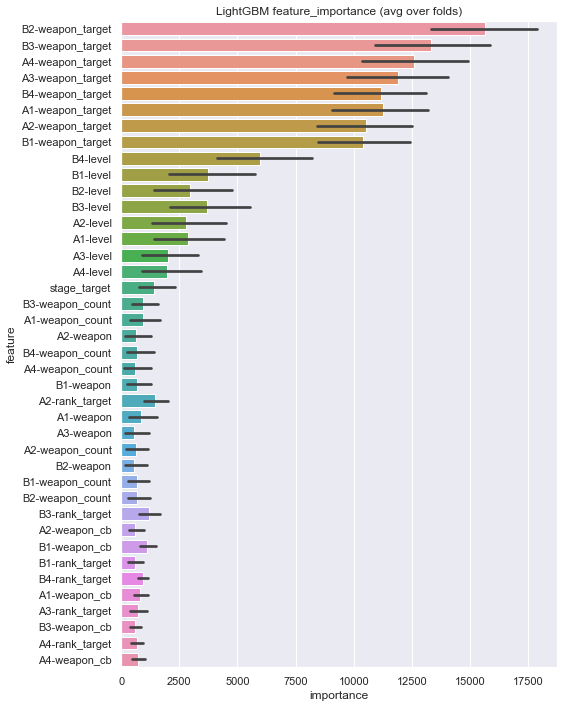

In [73]:
class Model:
    def __init__(self, OUTPUT_DIR):
        self.OUTPUT_DIR = OUTPUT_DIR

    # LightGBM GBDT with KFold or Stratified KFold
    # Parameters from Tilii kernel: https://www.kaggle.com/tilii7/olivier-lightgbm-parameters-by-bayesian-opt/code
    def kfold_cv_LGBMClassifier(
        self,
        lgb_params: dict,
        df: pd.DataFrame,
        num_folds: int,
        target_col: str,
        del_cols=None,
        eval_metric="error",
        stratified=True,  # StratifiedKFoldにするか
        is_submission=False,  # Home_Credit_Default_Risk の submission.csv作成するか
        is_plot_perm_importance=False,  # permutation importanceも出すか. feature_importance はデフォルトでだす
    ):
        """
        LGBMClassifierでcross validation + feature_importance/permutation importance plot
        """
        # Divide in training/validation and test data
        train_df = df[df[target_col].notnull()].reset_index(drop=True)
        test_df = df[df[target_col].isnull()].reset_index(drop=True)
        print("Starting LightGBM. Train shape: {}, test shape: {}".format(train_df.shape, test_df.shape))
        del df
        gc.collect()
        
        # Cross validation model
        if stratified:
            folds = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=1001)
        else:
            folds = KFold(n_splits=num_folds, shuffle=True, random_state=1001)

        # Create arrays and dataframes to store results
        oof_preds = np.zeros(train_df.shape[0])
        sub_preds = np.zeros(test_df.shape[0])
        feature_importance_df = pd.DataFrame()
        permutation_importance_df = pd.DataFrame()
        result_scores = {}

        # 目的変数とID列など削除
        del_cols = del_cols.append(target_col) if del_cols is not None else [target_col]
        feats = [f for f in train_df.columns if f not in del_cols]

        for n_fold, (train_idx, valid_idx) in tqdm(
            enumerate(folds.split(train_df[feats], train_df[target_col]))
        ):
            t_fold_df = train_df.iloc[train_idx]
            v_fold_df = train_df.iloc[valid_idx]
            
            # カウントエンコディング
            t_fold_df, v_fold_df = count_encoder(t_fold_df, v_fold_df, cat_features=None)
            # ターゲットエンコディング
            t_fold_df, v_fold_df = target_encoder(t_fold_df, v_fold_df, target_col=target_col, cat_features=None)
            # CatBoostエンコディング
            t_fold_df, v_fold_df = catboost_encoder(t_fold_df, v_fold_df, target_col=target_col, cat_features=None)
            # ラベルエンコディング
            cate_cols = t_fold_df.select_dtypes(include=["object", "category", "bool"]).columns.to_list()
            for col in cate_cols:
                t_fold_df[col], uni = pd.factorize(t_fold_df[col])
                v_fold_df[col], uni = pd.factorize(v_fold_df[col])
            print("run encoding Train shape: {}, valid shape: {}".format(t_fold_df.shape, v_fold_df.shape))
            
            feats = t_fold_df.columns.to_list()
            feats.remove(target_col)
            
            train_x, train_y = (
                t_fold_df[feats],
                t_fold_df[target_col],
            )
            valid_x, valid_y = (
                v_fold_df[feats],
                v_fold_df[target_col],
            )
            
            # LightGBM parameters found by Bayesian optimization
            clf = LGBMClassifier(**lgb_params)

            clf.fit(
                train_x,
                train_y,
                eval_set=[(train_x, train_y), (valid_x, valid_y)],
                eval_metric=eval_metric,
                verbose=200,
                early_stopping_rounds=200,
            )

            # モデル保存
            joblib.dump(clf, f"{self.OUTPUT_DIR}/lgb-{n_fold + 1}.model", compress=True)
            
            # valid pred
            oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
            
            # test pred
            # カウントエンコディング
            tr_df, te_df = count_encoder(train_df, test_df, cat_features=None)
            # ターゲットエンコディング
            tr_df, te_df = target_encoder(tr_df, te_df, target_col=target_col, cat_features=None)
            # CatBoostエンコディング
            tr_df, te_df = catboost_encoder(tr_df, te_df, target_col=target_col, cat_features=None)
            # ラベルエンコディング
            cate_cols = tr_df.select_dtypes(include=["object", "category", "bool"]).columns.to_list()
            for col in cate_cols:
                tr_df[col], uni = pd.factorize(tr_df[col])
                te_df[col], uni = pd.factorize(te_df[col])
            sub_preds += clf.predict_proba(te_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits
            
            if eval_metric == "auc":
                fold_auc = roc_auc_score(valid_y, oof_preds[valid_idx])
                print("Fold %2d AUC : %.6f" % (n_fold + 1, fold_auc))
                result_scores[f"fold_auc_{str(n_fold + 1)}"] = fold_auc
            elif eval_metric == "error":
                # intにしないとaccuracy_score()エラーになる
                _pred = oof_preds[valid_idx]
                _pred[_pred >= 0.5] = 1
                _pred[_pred < 0.5] = 0
                fold_err = 1.0 - accuracy_score(valid_y, _pred)
                print("Fold %2d error : %.6f" % (n_fold + 1, fold_err))
                result_scores[f"fold_err_{str(n_fold + 1)}"] = fold_err

            # feature_importance
            fold_importance_df = pd.DataFrame()
            fold_importance_df["feature"] = feats
            fold_importance_df["importance"] = clf.feature_importances_
            fold_importance_df["fold"] = n_fold + 1
            feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)

            if is_plot_perm_importance:
                # permutation_importance
                # 時間かかるからifで制御する
                # scoringはsklearnのスコアリングパラメータ
                # accuracy や neg_mean_squared_log_error とか
                # https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter
                fold_importance_df = pd.DataFrame()
                fold_permutation = permutation_importance(
                    clf, valid_x, valid_y, scoring="roc_auc"
                )
                fold_permutation_df = pd.DataFrame(
                    {
                        "feature": valid_x.columns,
                        "importance": np.abs(
                            fold_permutation["importances_mean"]
                        ),  # マイナスとるのもあるので絶対値にする
                        "fold": n_fold + 1,
                    },
                )
                permutation_importance_df = pd.concat(
                    [permutation_importance_df, fold_permutation_df], axis=0
                )

            del clf, train_x, train_y, valid_x, valid_y
            gc.collect()

        if eval_metric == "auc":
            mean_fold_auc = roc_auc_score(train_df[target_col], oof_preds)
            print("Full AUC score %.6f" % mean_fold_auc)
            result_scores["mean_fold_auc"] = mean_fold_auc
        elif eval_metric == "error":
            # intにしないとaccuracy_score()エラーになる
            _pred = oof_preds
            _pred[_pred >= 0.5] = 1
            _pred[_pred < 0.5] = 0
            mean_fold_err = 1.0 - accuracy_score(train_df[target_col], _pred)
            print("Full error score %.6f" % mean_fold_err)
            result_scores["mean_fold_err"] = mean_fold_err

        # モデルのスコア出力
        result_scores_df = pd.DataFrame(result_scores.values(), index=result_scores.keys())
        result_scores_df.to_csv(f"{self.OUTPUT_DIR}/result_scores.tsv", sep="\t")

        # Write submission file (Home_Credit_Default_Risk)
        if is_submission:
            sub_preds[sub_preds >= 0.5] = 1
            sub_preds[sub_preds < 0.5] = 0
            test_df[target_col] = sub_preds
            submission_file_name = f"{self.OUTPUT_DIR}/submission_kernel.csv"
            sub_df = test_df[[target_col]]
            sub_df["id"] = test_df.index
            sub_df.astype(int)
            sub_df = sub_df[["id", "y"]]
            sub_df.to_csv(submission_file_name, index=False)

        # Plot feature importance
        Model("").display_importances(
            feature_importance_df,
            png_path=f"{self.OUTPUT_DIR}/lgbm_feature_importances.png",
            title="feature_importance",
        )
        if is_plot_perm_importance:
            Model("").display_importances(
                permutation_importance_df,
                png_path=f"{self.OUTPUT_DIR}/lgbm_permutation_importances.png",
                title="permutation_importance",
            )

        return feature_importance_df, permutation_importance_df

    # Display/plot feature/permutation importance
    @staticmethod
    def display_importances(
        importance_df_, png_path, title,
    ):
        cols = (
            importance_df_[["feature", "importance"]]
            .groupby("feature")
            .mean()
            .sort_values(by="importance", ascending=False)[:40]
            .index
        )
        best_features = importance_df_.loc[importance_df_.feature.isin(cols)]
        plt.figure(figsize=(8, 10))
        sns.barplot(
            x="importance",
            y="feature",
            data=best_features.sort_values(by="importance", ascending=False),
        )
        plt.title(f"LightGBM {title} (avg over folds)")
        plt.tight_layout()
        plt.savefig(png_path)


if __name__ == "__main__":
    df = df_all
    
    #df_all = pd.read_csv(f"{OUT_DATA}/feature_add.csv")
    #cols = pd.read_csv(f"{OUT_DATA}/feature_selections.csv")["feature_selections"].values.tolist()
    #cols.append("y")
    #df = df_all[cols]
    
    is_debug = False
    #is_debug = True
    if is_debug:
        _df = df.head(1000)
        _df = _df.append(df.tail(100))
        df = _df
    
    model = Model(OUT_MODEL)
    lgb_params = dict(
        n_estimators=10000,
        learning_rate=0.01,
        silent=-1,
        verbose=-1,
        # verbose=1,
        importance_type="gain",
    )
    params = dict(
        lgb_params=lgb_params,
        df=df,
        num_folds=10,
        target_col="y",
        del_cols=None,
        eval_metric="error",
        stratified=True,
        is_submission=True,
        is_plot_perm_importance=False,
    )
    feat_importance, perm_importance = model.kfold_cv_LGBMClassifier(**params)

# パラメータチューニング

Starting LightGBM. Train shape: (66125, 38), test shape: (28340, 38)















0it [00:00, ?it/s]

run encoding Train shape: (59512, 95), valid shape: (6613, 95)


Searching the best hyperparameters...
[I 2020-08-23 16:36:00,456] Finished trial#0 with value: 0.6788577708403787 with parameters: {'feature_fraction': 0.45000000000000007, 'max_depth': 4, 'num_leaves': 7, 'min_data_in_leaf': 7451, 'lambda_l1': 4.1678286404065906e-05, 'lambda_l2': 0.0012750463395227512, 'bagging_fraction': 0.7, 'bagging_freq': 1}. Best is trial#0 with value: 0.6788577708403787.
[I 2020-08-23 16:36:01,573] Finished trial#1 with value: 0.6769154645256374 with parameters: {'feature_fraction': 0.9, 'max_depth': 5, 'num_leaves': 20, 'min_data_in_leaf': 112, 'lambda_l1': 4.193379339192885e-09, 'lambda_l2': 0.0017632750721887243, 'bagging_fraction': 0.55, 'bagging_freq': 3}. Best is trial#1 with value: 0.6769154645256374.
[I 2020-08-23 16:36:02,644] Finished trial#2 with value: 0.6783037343406415 with parameters: {'feature_fraction': 0.5, 'max_depth': 4, 'num_leaves': 10, 'min_data_in_leaf': 3916, 'lambda_l1': 5.42997867679821e-08, 'lambda_l2': 0.0002662289057511148, 'bagging

Fold  1 error : 0.443369















1it [00:56, 56.46s/it]

run encoding Train shape: (59512, 95), valid shape: (6613, 95)


Searching the best hyperparameters...
[I 2020-08-23 16:36:56,038] Finished trial#0 with value: 0.6754333795383677 with parameters: {'feature_fraction': 0.4, 'max_depth': 6, 'num_leaves': 36, 'min_data_in_leaf': 1119, 'lambda_l1': 5.968706688671628e-08, 'lambda_l2': 8.210695976830301e-06, 'bagging_fraction': 0.7, 'bagging_freq': 9}. Best is trial#0 with value: 0.6754333795383677.
[I 2020-08-23 16:36:56,996] Finished trial#1 with value: 0.6764681943707087 with parameters: {'feature_fraction': 0.45000000000000007, 'max_depth': 7, 'num_leaves': 113, 'min_data_in_leaf': 269, 'lambda_l1': 0.9985060040833866, 'lambda_l2': 2.318689790982612e-06, 'bagging_fraction': 0.5, 'bagging_freq': 2}. Best is trial#0 with value: 0.6754333795383677.
[I 2020-08-23 16:36:58,473] Finished trial#2 with value: 0.6758569854919333 with parameters: {'feature_fraction': 0.5, 'max_depth': 6, 'num_leaves': 22, 'min_data_in_leaf': 2176, 'lambda_l1': 0.022888187206302386, 'lambda_l2': 0.203224031029545, 'bagging_fracti

Fold  2 error : 0.457886















2it [01:49, 55.43s/it]

run encoding Train shape: (59512, 95), valid shape: (6613, 95)


Searching the best hyperparameters...
[I 2020-08-23 16:37:49,772] Finished trial#0 with value: 0.6790519356689784 with parameters: {'feature_fraction': 0.7000000000000001, 'max_depth': 4, 'num_leaves': 3, 'min_data_in_leaf': 10010, 'lambda_l1': 0.0009796999718340229, 'lambda_l2': 0.0033907181951261635, 'bagging_fraction': 0.8500000000000001, 'bagging_freq': 9}. Best is trial#0 with value: 0.6790519356689784.
[I 2020-08-23 16:37:50,890] Finished trial#1 with value: 0.6759025561973283 with parameters: {'feature_fraction': 0.15000000000000002, 'max_depth': 6, 'num_leaves': 33, 'min_data_in_leaf': 469, 'lambda_l1': 0.0005109996964524032, 'lambda_l2': 3.83907709849013, 'bagging_fraction': 0.75, 'bagging_freq': 3}. Best is trial#1 with value: 0.6759025561973283.
[I 2020-08-23 16:37:52,920] Finished trial#2 with value: 0.6761611380104213 with parameters: {'feature_fraction': 0.15000000000000002, 'max_depth': 1, 'num_leaves': 2, 'min_data_in_leaf': 237, 'lambda_l1': 0.0010160639018207901, 'lam

Fold  3 error : 0.449267















3it [02:42, 54.56s/it]

run encoding Train shape: (59512, 95), valid shape: (6613, 95)


Searching the best hyperparameters...
[I 2020-08-23 16:38:42,020] Finished trial#0 with value: 0.6766681485529594 with parameters: {'feature_fraction': 0.9500000000000001, 'max_depth': 5, 'num_leaves': 18, 'min_data_in_leaf': 2915, 'lambda_l1': 0.03272853509293519, 'lambda_l2': 2.38537177510441e-05, 'bagging_fraction': 0.65, 'bagging_freq': 7}. Best is trial#0 with value: 0.6766681485529594.
[I 2020-08-23 16:38:43,191] Finished trial#1 with value: 0.6878899087096179 with parameters: {'feature_fraction': 0.7000000000000001, 'max_depth': 1, 'num_leaves': 2, 'min_data_in_leaf': 21374, 'lambda_l1': 0.0006214549179409042, 'lambda_l2': 0.00015195194696229262, 'bagging_fraction': 0.9, 'bagging_freq': 7}. Best is trial#0 with value: 0.6766681485529594.
[I 2020-08-23 16:38:44,476] Finished trial#2 with value: 0.6765477228111039 with parameters: {'feature_fraction': 0.9500000000000001, 'max_depth': 6, 'num_leaves': 18, 'min_data_in_leaf': 1636, 'lambda_l1': 0.022878906974618075, 'lambda_l2': 4.9

Fold  4 error : 0.460608















4it [03:42, 56.41s/it]

run encoding Train shape: (59512, 95), valid shape: (6613, 95)


Searching the best hyperparameters...
[I 2020-08-23 16:39:44,245] Finished trial#0 with value: 0.6771670033161817 with parameters: {'feature_fraction': 0.7000000000000001, 'max_depth': 5, 'num_leaves': 6, 'min_data_in_leaf': 8184, 'lambda_l1': 2.075101101606714, 'lambda_l2': 1.1552028240104821, 'bagging_fraction': 0.95, 'bagging_freq': 2}. Best is trial#0 with value: 0.6771670033161817.
[I 2020-08-23 16:39:45,359] Finished trial#1 with value: 0.6758755709337712 with parameters: {'feature_fraction': 0.5, 'max_depth': 6, 'num_leaves': 26, 'min_data_in_leaf': 29, 'lambda_l1': 0.002315575605673233, 'lambda_l2': 1.456885208476441e-09, 'bagging_fraction': 0.75, 'bagging_freq': 1}. Best is trial#1 with value: 0.6758755709337712.
[I 2020-08-23 16:39:46,168] Finished trial#2 with value: 0.676513111651875 with parameters: {'feature_fraction': 0.15000000000000002, 'max_depth': 6, 'num_leaves': 58, 'min_data_in_leaf': 120, 'lambda_l1': 6.136909313050369e-07, 'lambda_l2': 1.4384222528007647e-09, 'b

Fold  5 error : 0.464237















5it [04:43, 57.60s/it]

run encoding Train shape: (59513, 95), valid shape: (6612, 95)


Searching the best hyperparameters...
[I 2020-08-23 16:40:42,708] Finished trial#0 with value: 0.6764120597477203 with parameters: {'feature_fraction': 0.5, 'max_depth': 7, 'num_leaves': 87, 'min_data_in_leaf': 308, 'lambda_l1': 0.0954678977912343, 'lambda_l2': 0.7324312134734734, 'bagging_fraction': 0.6, 'bagging_freq': 3}. Best is trial#0 with value: 0.6764120597477203.
[I 2020-08-23 16:40:44,113] Finished trial#1 with value: 0.6759158846221242 with parameters: {'feature_fraction': 0.35, 'max_depth': 3, 'num_leaves': 3, 'min_data_in_leaf': 698, 'lambda_l1': 1.2772109295317097e-05, 'lambda_l2': 0.0018801497251227008, 'bagging_fraction': 0.55, 'bagging_freq': 1}. Best is trial#1 with value: 0.6759158846221242.
[I 2020-08-23 16:40:45,482] Finished trial#2 with value: 0.675383412399854 with parameters: {'feature_fraction': 0.25, 'max_depth': 5, 'num_leaves': 9, 'min_data_in_leaf': 289, 'lambda_l1': 0.09289765060181425, 'lambda_l2': 7.213407237930891e-08, 'bagging_fraction': 0.7, 'bagging

Fold  6 error : 0.453872















6it [05:40, 57.66s/it]

run encoding Train shape: (59513, 95), valid shape: (6612, 95)


Searching the best hyperparameters...
[I 2020-08-23 16:41:41,104] Finished trial#0 with value: 0.6786668584844726 with parameters: {'feature_fraction': 0.25, 'max_depth': 3, 'num_leaves': 5, 'min_data_in_leaf': 9494, 'lambda_l1': 3.191278882964088e-05, 'lambda_l2': 0.0034860953481810645, 'bagging_fraction': 0.8500000000000001, 'bagging_freq': 6}. Best is trial#0 with value: 0.6786668584844726.
[I 2020-08-23 16:41:42,175] Finished trial#1 with value: 0.6759311730870763 with parameters: {'feature_fraction': 0.45000000000000007, 'max_depth': 5, 'num_leaves': 17, 'min_data_in_leaf': 1621, 'lambda_l1': 0.00029494007931841093, 'lambda_l2': 0.013715558885509254, 'bagging_fraction': 0.5, 'bagging_freq': 1}. Best is trial#1 with value: 0.6759311730870763.
[I 2020-08-23 16:41:43,236] Finished trial#2 with value: 0.6761097606720383 with parameters: {'feature_fraction': 0.6, 'max_depth': 7, 'num_leaves': 122, 'min_data_in_leaf': 483, 'lambda_l1': 3.2823123151994573, 'lambda_l2': 0.0015669418344823

Fold  7 error : 0.451452















7it [06:37, 57.47s/it]

run encoding Train shape: (59513, 95), valid shape: (6612, 95)


Searching the best hyperparameters...
[I 2020-08-23 16:42:38,276] Finished trial#0 with value: 0.6815465749716111 with parameters: {'feature_fraction': 0.9, 'max_depth': 2, 'num_leaves': 2, 'min_data_in_leaf': 13818, 'lambda_l1': 3.183731721687e-09, 'lambda_l2': 1.0240770528410714, 'bagging_fraction': 0.7, 'bagging_freq': 3}. Best is trial#0 with value: 0.6815465749716111.
[I 2020-08-23 16:42:39,475] Finished trial#1 with value: 0.6761683097978924 with parameters: {'feature_fraction': 0.15000000000000002, 'max_depth': 4, 'num_leaves': 12, 'min_data_in_leaf': 2632, 'lambda_l1': 0.8853356057435608, 'lambda_l2': 0.00010756782194786701, 'bagging_fraction': 0.95, 'bagging_freq': 4}. Best is trial#1 with value: 0.6761683097978924.
[I 2020-08-23 16:42:40,708] Finished trial#2 with value: 0.6759869200902312 with parameters: {'feature_fraction': 0.4, 'max_depth': 5, 'num_leaves': 23, 'min_data_in_leaf': 1556, 'lambda_l1': 4.792188573723843e-08, 'lambda_l2': 0.00026980547476734043, 'bagging_frac

Fold  8 error : 0.454477















8it [07:26, 54.70s/it]

run encoding Train shape: (59513, 95), valid shape: (6612, 95)


Searching the best hyperparameters...
[I 2020-08-23 16:43:26,853] Finished trial#0 with value: 0.6800081503169338 with parameters: {'feature_fraction': 1.0, 'max_depth': 1, 'num_leaves': 2, 'min_data_in_leaf': 11177, 'lambda_l1': 1.0311769591728088, 'lambda_l2': 0.0026860302799550646, 'bagging_fraction': 0.7, 'bagging_freq': 6}. Best is trial#0 with value: 0.6800081503169338.
[I 2020-08-23 16:43:27,178] Finished trial#1 with value: 0.6931432109650121 with parameters: {'feature_fraction': 0.1, 'max_depth': 1, 'num_leaves': 2, 'min_data_in_leaf': 27187, 'lambda_l1': 0.00016041623062773087, 'lambda_l2': 3.447016740626343, 'bagging_fraction': 0.7, 'bagging_freq': 2}. Best is trial#0 with value: 0.6800081503169338.
[I 2020-08-23 16:43:28,334] Finished trial#2 with value: 0.6763809820778954 with parameters: {'feature_fraction': 0.35, 'max_depth': 4, 'num_leaves': 13, 'min_data_in_leaf': 4211, 'lambda_l1': 9.341762074904329e-07, 'lambda_l2': 2.1194272981406415e-09, 'bagging_fraction': 0.85000

Fold  9 error : 0.456594















9it [08:27, 56.64s/it]

run encoding Train shape: (59513, 95), valid shape: (6612, 95)


Searching the best hyperparameters...
[I 2020-08-23 16:44:27,122] Finished trial#0 with value: 0.6748956662184156 with parameters: {'feature_fraction': 0.15000000000000002, 'max_depth': 7, 'num_leaves': 63, 'min_data_in_leaf': 796, 'lambda_l1': 1.0273956953892247, 'lambda_l2': 0.00022772109579007123, 'bagging_fraction': 0.9, 'bagging_freq': 4}. Best is trial#0 with value: 0.6748956662184156.
[I 2020-08-23 16:44:28,757] Finished trial#1 with value: 0.6750253143051304 with parameters: {'feature_fraction': 0.65, 'max_depth': 5, 'num_leaves': 21, 'min_data_in_leaf': 1222, 'lambda_l1': 1.1796932930136658e-07, 'lambda_l2': 0.000414080467252976, 'bagging_fraction': 0.8500000000000001, 'bagging_freq': 1}. Best is trial#0 with value: 0.6748956662184156.
[I 2020-08-23 16:44:29,979] Finished trial#2 with value: 0.6765274579342762 with parameters: {'feature_fraction': 0.65, 'max_depth': 7, 'num_leaves': 44, 'min_data_in_leaf': 14, 'lambda_l1': 2.7525288805215198e-08, 'lambda_l2': 5.478331585455185

Fold 10 error : 0.469903















10it [09:32, 57.28s/it]


Full error score 0.456166


C:\Users\81908\Anaconda3\envs\tfgpu\lib\site-packages\ipykernel_launcher.py:183: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


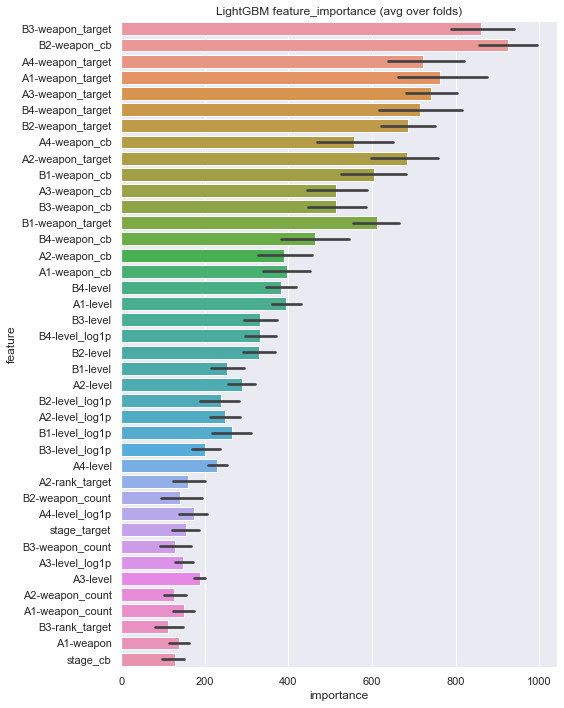

In [83]:
import sys
sys.path.append(r'C:\Users\81908\Git\OptGBM')
import optgbm as lgb

class Model:
    def __init__(self, OUTPUT_DIR):
        self.OUTPUT_DIR = OUTPUT_DIR

    # LightGBM GBDT with KFold or Stratified KFold
    # Parameters from Tilii kernel: https://www.kaggle.com/tilii7/olivier-lightgbm-parameters-by-bayesian-opt/code
    def kfold_cv_LGBMClassifier(
        self,
        lgb_params: dict,
        df: pd.DataFrame,
        num_folds: int,
        target_col: str,
        del_cols=None,
        eval_metric="error",
        stratified=True,  # StratifiedKFoldにするか
        is_submission=False,  # Home_Credit_Default_Risk の submission.csv作成するか
        is_plot_perm_importance=False,  # permutation importanceも出すか. feature_importance はデフォルトでだす
    ):
        """
        LGBMClassifierでcross validation + feature_importance/permutation importance plot
        """
        # Divide in training/validation and test data
        train_df = df[df[target_col].notnull()].reset_index(drop=True)
        test_df = df[df[target_col].isnull()].reset_index(drop=True)
        print("Starting LightGBM. Train shape: {}, test shape: {}".format(train_df.shape, test_df.shape))
        del df
        gc.collect()
        
        # Cross validation model
        if stratified:
            folds = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=1001)
        else:
            folds = KFold(n_splits=num_folds, shuffle=True, random_state=1001)

        # Create arrays and dataframes to store results
        oof_preds = np.zeros(train_df.shape[0])
        sub_preds = np.zeros(test_df.shape[0])
        feature_importance_df = pd.DataFrame()
        permutation_importance_df = pd.DataFrame()
        result_scores = {}

        # 目的変数とID列など削除
        del_cols = del_cols.append(target_col) if del_cols is not None else [target_col]
        feats = [f for f in train_df.columns if f not in del_cols]

        for n_fold, (train_idx, valid_idx) in tqdm(
            enumerate(folds.split(train_df[feats], train_df[target_col]))
        ):
            t_fold_df = train_df.iloc[train_idx]
            v_fold_df = train_df.iloc[valid_idx]
            
            # カウントエンコディング
            t_fold_df, v_fold_df = count_encoder(t_fold_df, v_fold_df, cat_features=None)
            # ターゲットエンコディング
            t_fold_df, v_fold_df = target_encoder(t_fold_df, v_fold_df, target_col=target_col, cat_features=None)
            # CatBoostエンコディング
            t_fold_df, v_fold_df = catboost_encoder(t_fold_df, v_fold_df, target_col=target_col, cat_features=None)
            # ラベルエンコディング
            cate_cols = t_fold_df.select_dtypes(include=["object", "category", "bool"]).columns.to_list()
            for col in cate_cols:
                t_fold_df[col], uni = pd.factorize(t_fold_df[col])
                v_fold_df[col], uni = pd.factorize(v_fold_df[col])
            print("run encoding Train shape: {}, valid shape: {}".format(t_fold_df.shape, v_fold_df.shape))
            
            feats = t_fold_df.columns.to_list()
            feats.remove(target_col)
            
            train_x, train_y = (
                t_fold_df[feats],
                t_fold_df[target_col],
            )
            valid_x, valid_y = (
                v_fold_df[feats],
                v_fold_df[target_col],
            )
            
            # LightGBM parameters found by Bayesian optimization
            clf = lgb.LGBMClassifier(**lgb_params)

            clf.fit(
                train_x,
                train_y,
                #eval_set=[(train_x, train_y), (valid_x, valid_y)],
                #eval_metric=eval_metric,
                #verbose=200,
                #early_stopping_rounds=200,
            )

            # モデル保存
            joblib.dump(clf, f"{self.OUTPUT_DIR}/lgb-{n_fold + 1}.model", compress=True)
            
            # valid pred
            oof_preds[valid_idx] = clf.predict_proba(valid_x, num_iteration=clf.best_iteration_)[:, 1]
            
            # test pred
            # カウントエンコディング
            tr_df, te_df = count_encoder(train_df, test_df, cat_features=None)
            # ターゲットエンコディング
            tr_df, te_df = target_encoder(tr_df, te_df, target_col=target_col, cat_features=None)
            # CatBoostエンコディング
            tr_df, te_df = catboost_encoder(tr_df, te_df, target_col=target_col, cat_features=None)
            # ラベルエンコディング
            cate_cols = tr_df.select_dtypes(include=["object", "category", "bool"]).columns.to_list()
            for col in cate_cols:
                tr_df[col], uni = pd.factorize(tr_df[col])
                te_df[col], uni = pd.factorize(te_df[col])
            sub_preds += clf.predict_proba(te_df[feats], num_iteration=clf.best_iteration_)[:, 1] / folds.n_splits
            
            if eval_metric == "auc":
                fold_auc = roc_auc_score(valid_y, oof_preds[valid_idx])
                print("Fold %2d AUC : %.6f" % (n_fold + 1, fold_auc))
                result_scores[f"fold_auc_{str(n_fold + 1)}"] = fold_auc
            elif eval_metric == "error":
                # intにしないとaccuracy_score()エラーになる
                _pred = oof_preds[valid_idx]
                _pred[_pred >= 0.5] = 1
                _pred[_pred < 0.5] = 0
                fold_err = 1.0 - accuracy_score(valid_y, _pred)
                print("Fold %2d error : %.6f" % (n_fold + 1, fold_err))
                result_scores[f"fold_err_{str(n_fold + 1)}"] = fold_err

            # feature_importance
            fold_importance_df = pd.DataFrame()
            fold_importance_df["feature"] = feats
            fold_importance_df["importance"] = clf.feature_importances_
            fold_importance_df["fold"] = n_fold + 1
            feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)

            if is_plot_perm_importance:
                # permutation_importance
                # 時間かかるからifで制御する
                # scoringはsklearnのスコアリングパラメータ
                # accuracy や neg_mean_squared_log_error とか
                # https://scikit-learn.org/stable/modules/model_evaluation.html#scoring-parameter
                fold_importance_df = pd.DataFrame()
                fold_permutation = permutation_importance(
                    clf, valid_x, valid_y, scoring="roc_auc"
                )
                fold_permutation_df = pd.DataFrame(
                    {
                        "feature": valid_x.columns,
                        "importance": np.abs(
                            fold_permutation["importances_mean"]
                        ),  # マイナスとるのもあるので絶対値にする
                        "fold": n_fold + 1,
                    },
                )
                permutation_importance_df = pd.concat(
                    [permutation_importance_df, fold_permutation_df], axis=0
                )

            del clf, train_x, train_y, valid_x, valid_y
            gc.collect()

        if eval_metric == "auc":
            mean_fold_auc = roc_auc_score(train_df[target_col], oof_preds)
            print("Full AUC score %.6f" % mean_fold_auc)
            result_scores["mean_fold_auc"] = mean_fold_auc
        elif eval_metric == "error":
            # intにしないとaccuracy_score()エラーになる
            _pred = oof_preds
            _pred[_pred >= 0.5] = 1
            _pred[_pred < 0.5] = 0
            mean_fold_err = 1.0 - accuracy_score(train_df[target_col], _pred)
            print("Full error score %.6f" % mean_fold_err)
            result_scores["mean_fold_err"] = mean_fold_err

        # モデルのスコア出力
        result_scores_df = pd.DataFrame(result_scores.values(), index=result_scores.keys())
        result_scores_df.to_csv(f"{self.OUTPUT_DIR}/result_scores.tsv", sep="\t")

        # Write submission file (Home_Credit_Default_Risk)
        if is_submission:
            sub_preds[sub_preds >= 0.5] = 1
            sub_preds[sub_preds < 0.5] = 0
            test_df[target_col] = sub_preds
            submission_file_name = f"{self.OUTPUT_DIR}/submission_kernel.csv"
            sub_df = test_df[[target_col]]
            sub_df["id"] = test_df.index
            sub_df.astype(int)
            sub_df = sub_df[["id", "y"]]
            sub_df.to_csv(submission_file_name, index=False)

        # Plot feature importance
        Model("").display_importances(
            feature_importance_df,
            png_path=f"{self.OUTPUT_DIR}/lgbm_feature_importances.png",
            title="feature_importance",
        )
        if is_plot_perm_importance:
            Model("").display_importances(
                permutation_importance_df,
                png_path=f"{self.OUTPUT_DIR}/lgbm_permutation_importances.png",
                title="permutation_importance",
            )

        return feature_importance_df, permutation_importance_df

    # Display/plot feature/permutation importance
    @staticmethod
    def display_importances(
        importance_df_, png_path, title,
    ):
        cols = (
            importance_df_[["feature", "importance"]]
            .groupby("feature")
            .mean()
            .sort_values(by="importance", ascending=False)[:40]
            .index
        )
        best_features = importance_df_.loc[importance_df_.feature.isin(cols)]
        plt.figure(figsize=(8, 10))
        sns.barplot(
            x="importance",
            y="feature",
            data=best_features.sort_values(by="importance", ascending=False),
        )
        plt.title(f"LightGBM {title} (avg over folds)")
        plt.tight_layout()
        plt.savefig(png_path)


if __name__ == "__main__":
    df = df_all
    
    #df_all = pd.read_csv(f"{OUT_DATA}/feature_add.csv")
    #cols = pd.read_csv(f"{OUT_DATA}/feature_selections.csv")["feature_selections"].values.tolist()
    #cols.append("y")
    #df = df_all[cols]
    
    is_debug = False
    #is_debug = True
    if is_debug:
        _df = df.head(1000)
        _df = _df.append(df.tail(100))
        df = _df
    
    model = Model(OUT_MODEL)
    lgb_params = dict(
        n_estimators=10000,
        learning_rate=0.1,
        silent=-1,
        verbose=-1,
        # verbose=1,
        importance_type="gain",
    )
    params = dict(
        lgb_params=lgb_params,
        df=df,
        num_folds=10,
        target_col="y",
        del_cols=None,
        eval_metric="error",
        stratified=True,
        is_submission=True,
        is_plot_perm_importance=False,
    )
    feat_importance, perm_importance = model.kfold_cv_LGBMClassifier(**params)

In [79]:
import optgbm as lgb
from sklearn.datasets import load_boston

import pandas as pd
import seaborn as sns
df = sns.load_dataset("titanic")
df = df.drop(["alive"], axis=1)
for col in ["sex", "embarked", "who", "embark_town", "class", "adult_male", "alone", "deck"]:
    df[col], uni = pd.factorize(df[col])
df.iloc[700:, 0] = np.nan  # test set用意
y = df["survived"]
X = df.drop("survived", axis=1)
display(df)

reg = lgb.LGBMClassifier(random_state=0)
reg.fit(X, y)
score = reg.score(X, y)

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alone
0,0.0,3,0,22.0,1,0,7.2500,0,0,0,0,-1,0,0
1,1.0,1,1,38.0,1,0,71.2833,1,1,1,1,0,1,0
2,1.0,3,1,26.0,0,0,7.9250,0,0,1,1,-1,0,1
3,1.0,1,1,35.0,1,0,53.1000,0,1,1,1,0,0,0
4,0.0,3,0,35.0,0,0,8.0500,0,0,0,0,-1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
886,NaN,2,0,27.0,0,0,13.0000,0,2,0,0,-1,0,1
887,NaN,1,1,19.0,0,0,30.0000,0,1,1,1,5,0,1
888,NaN,3,1,NaN,1,2,23.4500,0,0,1,1,-1,0,0
889,NaN,1,0,26.0,0,0,30.0000,1,1,0,0,0,1,1


Searching the best hyperparameters...
C:\Users\81908\Anaconda3\envs\tfgpu\lib\site-packages\sklearn\model_selection\_split.py:672: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=2.
  % (min_groups, self.n_splits)), UserWarning)
[I 2020-08-23 16:23:57,120] Finished trial#0 with value: 7.948321309150955 with parameters: {'feature_fraction': 0.6, 'max_depth': 6, 'num_leaves': 2, 'min_data_in_leaf': 324, 'lambda_l1': 0.37971362090925165, 'lambda_l2': 0.2968365585489856, 'bagging_fraction': 0.8, 'bagging_freq': 3}. Best is trial#0 with value: 7.948321309150955.
C:\Users\81908\Anaconda3\envs\tfgpu\lib\site-packages\sklearn\model_selection\_split.py:672: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=2.
  % (min_groups, self.n_splits)), UserWarning)
[I 2020-08-23 16:23:57,314] Finished trial#1 with value: 7.985555821716945 with parameters: {'feature_fraction': 0.5, 'max_depth': 7, 'num_leaves': 90, 'min_

[I 2020-08-23 16:24:00,084] Finished trial#14 with value: 7.798517193578067 with parameters: {'feature_fraction': 0.25, 'max_depth': 6, 'num_leaves': 61, 'min_data_in_leaf': 4, 'lambda_l1': 6.973223314043678, 'lambda_l2': 6.88336920582255, 'bagging_fraction': 0.95, 'bagging_freq': 4}. Best is trial#10 with value: 7.793749595251612.
C:\Users\81908\Anaconda3\envs\tfgpu\lib\site-packages\sklearn\model_selection\_split.py:672: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=2.
  % (min_groups, self.n_splits)), UserWarning)
[I 2020-08-23 16:24:00,220] Finished trial#15 with value: 8.014946593633892 with parameters: {'feature_fraction': 0.25, 'max_depth': 5, 'num_leaves': 32, 'min_data_in_leaf': 12, 'lambda_l1': 0.040244637460352284, 'lambda_l2': 0.0020105722015596947, 'bagging_fraction': 0.7, 'bagging_freq': 7}. Best is trial#10 with value: 7.793749595251612.
C:\Users\81908\Anaconda3\envs\tfgpu\lib\site-packages\sklearn\model_selection\_split.py:6

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [22]:

X_train

,A1-level,A1-rank,A1-weapon,A2-level,A2-rank,A2-weapon,A3-level,A3-rank,A3-weapon,A4-level,...,A4-levelB1-level_minus,A4-levelB2-level_minus,A4-levelB3-level_minus,A4-levelB4-level_minus,B1-levelB2-level_minus,B1-levelB3-level_minus,B1-levelB4-level_minus,B2-levelB3-level_minus,B2-levelB4-level_minus,B3-levelB4-level_minus
0,139,NaN,sshooter_becchu,118.0,NaN,soytuber_custom,13.0,NaN,pablo_hue,10.0,...,-18.0,-16.0,-58.0,-21.0,2.0,-40.0,-3.0,-42.0,-5.0,37.0
1,198,NaN,parashelter_sorella,77.0,NaN,jetsweeper,198.0,NaN,campingshelter_camo,123.0,...,40.0,5.0,-45.0,-28.0,-35.0,-85.0,-68.0,-50.0,-33.0,17.0
2,114,a-,nzap89,68.0,a,quadhopper_black,225.0,a,prime_becchu,107.0,...,57.0,-56.0,-53.0,-19.0,-113.0,-110.0,-76.0,3.0,37.0,34.0
3,336,NaN,bamboo14mk1,131.0,NaN,splatroller_becchu,189.0,NaN,dynamo_tesla,41.0,...,-232.0,-148.0,-153.0,-350.0,84.0,79.0,-118.0,-5.0,-202.0,-197.0
4,299,x,bold_7,97.0,x,hissen_hue,96.0,x,h3reelgun_d,136.0,...,35.0,91.0,-110.0,-24.0,56.0,-145.0,-59.0,-201.0,-115.0,86.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66120,66,a,hokusai_becchu,113.0,a,soytuber,114.0,a+,wakaba,123.0,...,-386.0,-149.0,85.0,-160.0,237.0,471.0,226.0,234.0,-11.0,-245.0
66121,204,s+,hokusai_becchu,96.0,s+,prime_becchu,112.0,s+,prime_becchu,44.0,...,-119.0,-123.0,-144.0,-126.0,-4.0,-25.0,-7.0,-21.0,-3.0,18.0
66122,116,a+,prime_collabo,86.0,a,promodeler_rg,19.0,a-,hissen,69.0,...,-136.0,-1.0,-122.0,-70.0,135.0,14.0,66.0,-121.0,-69.0,52.0
66123,210,s+,heroroller_replica,96.0,s+,sharp_neo,126.0,s+,dualsweeper_custom,453.0,...,362.0,58.0,230.0,259.0,-304.0,-132.0,-103.0,172.0,201.0,29.0


In [18]:
from xfeat.utils import compress_df

In [26]:
df_all.select_dtypes(
    include=["int", "int32", "int64", "float", "float32", "float64"]
).columns.to_list()

['A1-level',
 'A2-level',
 'A3-level',
 'A4-level',
 'B1-level',
 'B2-level',
 'B3-level',
 'B4-level',
 'id',
 'y',
 'A2-level_log1p',
 'A3-level_log1p',
 'A4-level_log1p',
 'B1-level_log1p',
 'B2-level_log1p',
 'B3-level_log1p',
 'B4-level_log1p',
 'year',
 'month',
 'day',
 'dayofyear',
 'dayofweek',
 'weekend',
 'hour']

In [21]:
df_all.select_dtypes(include=["object", "category", "bool"]).columns.to_list()

['A1-rank',
 'A1-weapon',
 'A2-rank',
 'A2-weapon',
 'A3-rank',
 'A3-weapon',
 'A4-rank',
 'A4-weapon',
 'B1-rank',
 'B1-weapon',
 'B2-rank',
 'B2-weapon',
 'B3-rank',
 'B3-weapon',
 'B4-rank',
 'B4-weapon',
 'lobby-mode',
 'mode',
 'stage']